## Rainfall Prediction - Weather Forecasting

### Problem Statement:

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.

Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia.


a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import numpy as np

In [276]:
rp=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv")

In [277]:
pd.set_option('display.max_columns',None)

In [278]:
rp.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [279]:
rp.shape

(8425, 23)

In [280]:
rp.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [281]:
rp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [282]:
rp.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

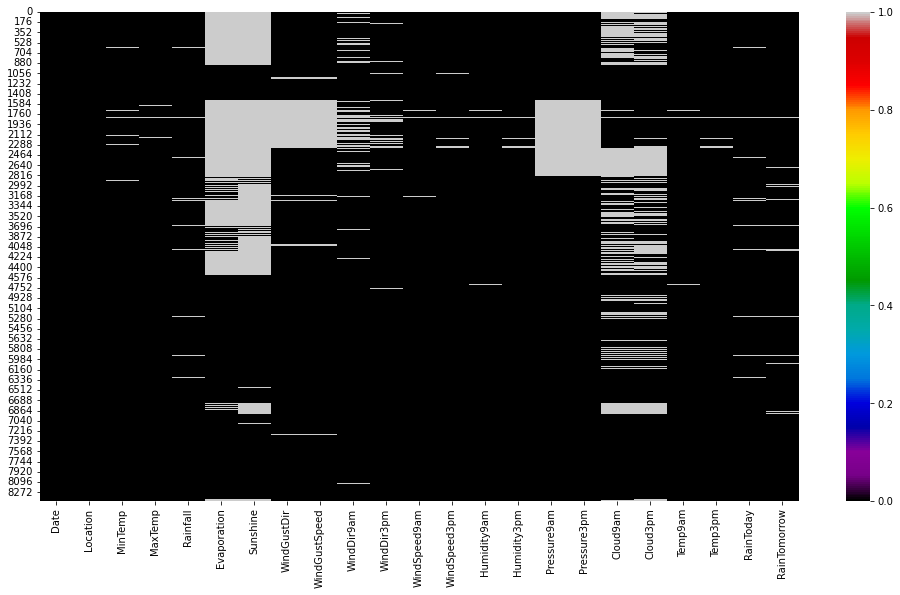

In [283]:
plt.figure(figsize=[17,9])
sns.heatmap(rp.isnull(),cmap='nipy_spectral')
plt.show()

### Observation-1

In the above dataset :

1) The size of table is 8425 * 23 i.e. no. of rows are 8425 and no. of columns are 23(including target).

2) Out of 23 columns 16 columns are continuous in nature and rest 7 are object type.

3) Null values are present in the data set as we can see in ths seaborn heatmap so there is a need to adopt imputation technique.

4) In case of object data type, we will apply the encoding technique to convert the values in the numeric format.

# EDA
###### Exploratory Data Analysis (EDA): 
    EDA process will give us the batter understanding towards the pattern of Dataset.

## Univariate analysis

['No' 'Yes' nan]


No     6195
Yes    1991
Name: RainTomorrow, dtype: int64


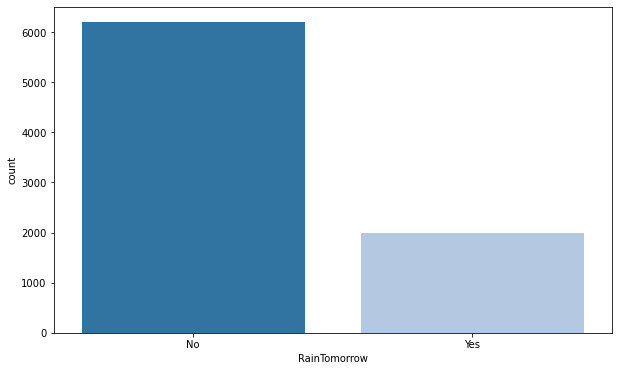

In [284]:
print(rp['RainTomorrow'].unique())
print("\n")
print(rp['RainTomorrow'].value_counts())
plt.figure(figsize=[10,6])
sns.countplot(rp['RainTomorrow'],palette='tab20')
plt.show()

['No' 'Yes' nan]


No     6195
Yes    1990
Name: RainToday, dtype: int64


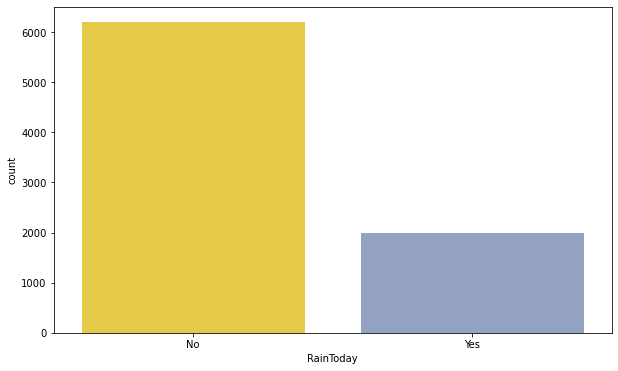

In [285]:
print(rp['RainToday'].unique())
print("\n")
print(rp['RainToday'].value_counts())
plt.figure(figsize=[10,6])
sns.countplot(rp['RainToday'],palette='Set2_r')
plt.show()

['Albury' 'CoffsHarbour' 'Newcastle' 'Penrith' 'Williamtown' 'Wollongong'
 'Melbourne' 'Brisbane' 'Adelaide' 'PerthAirport' 'Darwin' 'Uluru']


Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64


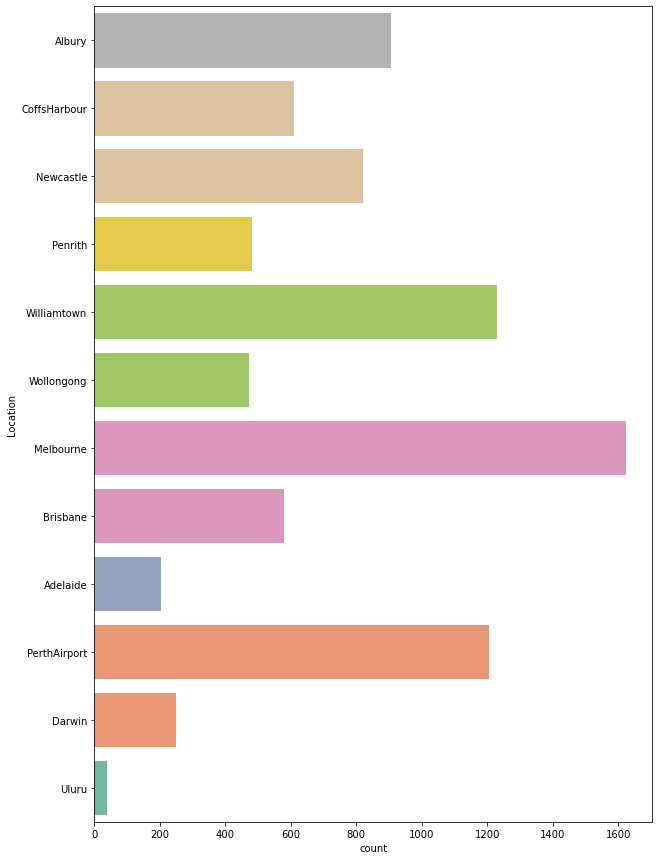

In [286]:
print(rp['Location'].unique())
print("\n")
print(rp['Location'].value_counts())
plt.figure(figsize=[10,15])
sns.countplot(y=rp['Location'],palette='Set2_r')
plt.show()

['W' 'WNW' 'WSW' 'NE' 'NNW' 'N' 'NNE' 'SW' nan 'ENE' 'SSE' 'S' 'NW' 'SE'
 'ESE' 'E' 'SSW']


N      713
SSE    578
S      577
SW     572
E      557
WNW    531
W      507
WSW    504
SE     484
ENE    415
SSW    396
NW     383
NE     353
NNE    343
ESE    302
NNW    219
Name: WindGustDir, dtype: int64


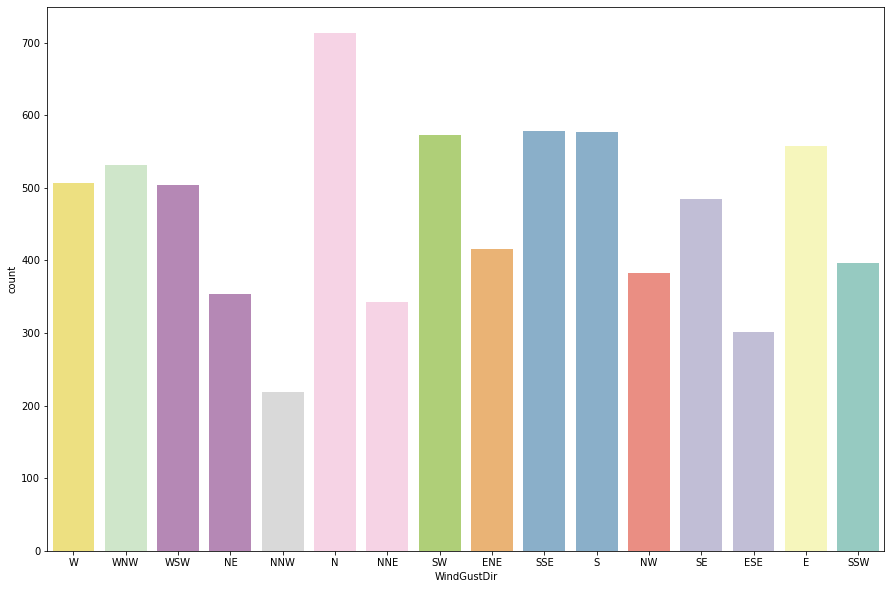

In [287]:
print(rp['WindGustDir'].unique())
print("\n")
print(rp['WindGustDir'].value_counts())
plt.figure(figsize=[15,10])
sns.countplot(x=rp['WindGustDir'],palette='Set3_r')
plt.show()

['W' 'NNW' 'SE' 'ENE' 'SW' 'SSE' 'S' 'NE' nan 'SSW' 'N' 'WSW' 'ESE' 'E'
 'NW' 'WNW' 'NNE']


N      906
SW     704
NW     625
WSW    543
SE     505
WNW    480
SSW    467
ENE    433
NNE    430
W      414
NE     409
S      402
E      380
SSE    365
NNW    280
ESE    253
Name: WindDir9am, dtype: int64


<AxesSubplot:ylabel='WindDir9am'>

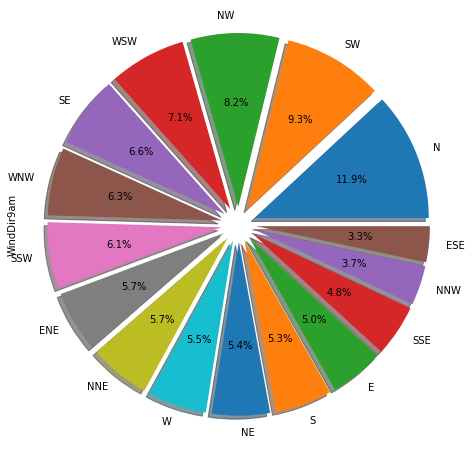

In [288]:
print(rp['WindDir9am'].unique())
print("\n")
print(rp['WindDir9am'].value_counts())
rp.WindDir9am.value_counts().plot.pie(explode=[0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1],shadow=True,
                                     figsize=(8,8),autopct="%1.1f%%")

### Bivariate analysis

Text(0.5, 1.0, 'Location and Raintomorrow')

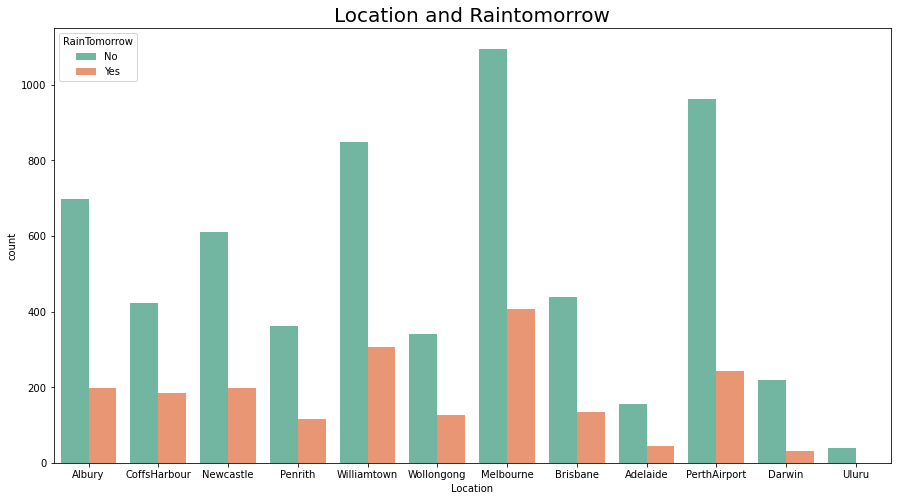

In [289]:
plt.figure(figsize=[15,8])
sns.countplot(rp["Location"], hue=rp["RainTomorrow"],palette='Set2')
plt.title("Location and Raintomorrow",fontsize=20)

Text(0.5, 1.0, 'Location and Raintoday')

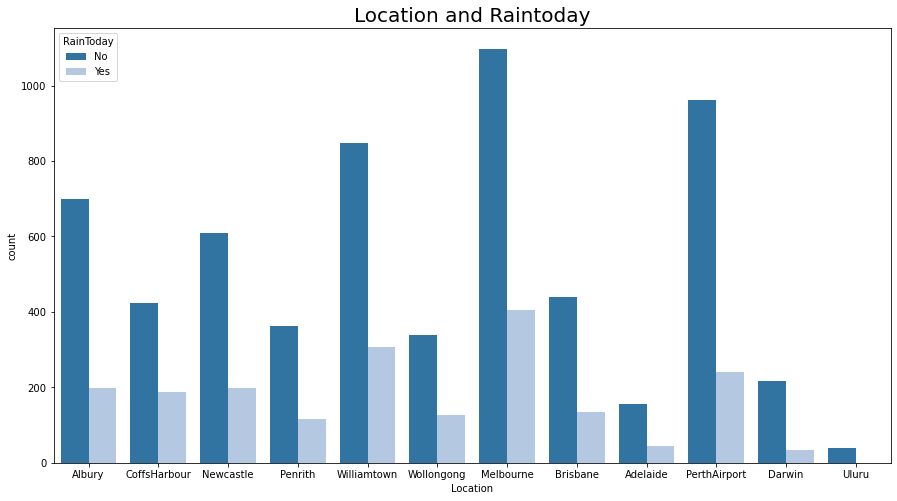

In [290]:
plt.figure(figsize=[15,8])
sns.countplot(rp["Location"], hue=rp["RainToday"],palette='tab20')
plt.title("Location and Raintoday",fontsize=20)

Text(0.5, 1.0, 'Location and WindDir9am')

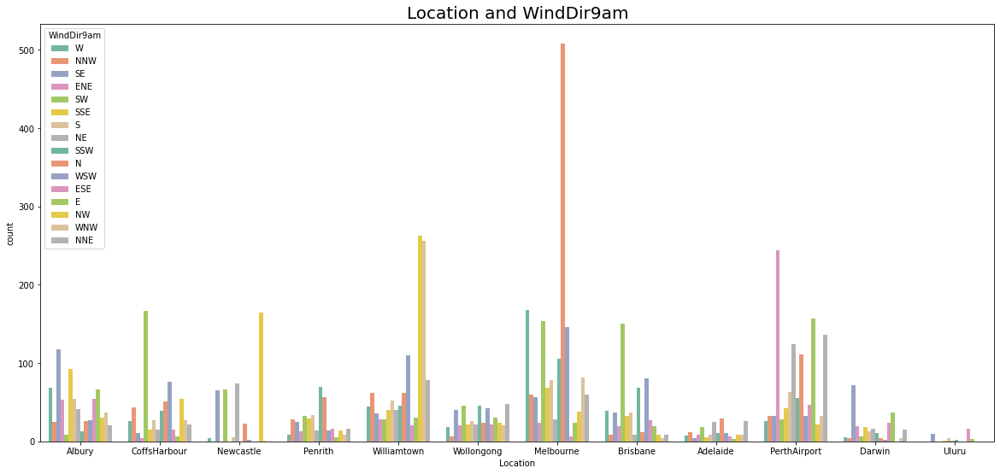

In [291]:
plt.figure(figsize=[20,9])
sns.countplot(rp["Location"], hue=rp["WindDir9am"],palette='Set2')
plt.title("Location and WindDir9am",fontsize=20)

Text(0.5, 1.0, 'Location and WindDir3pm')

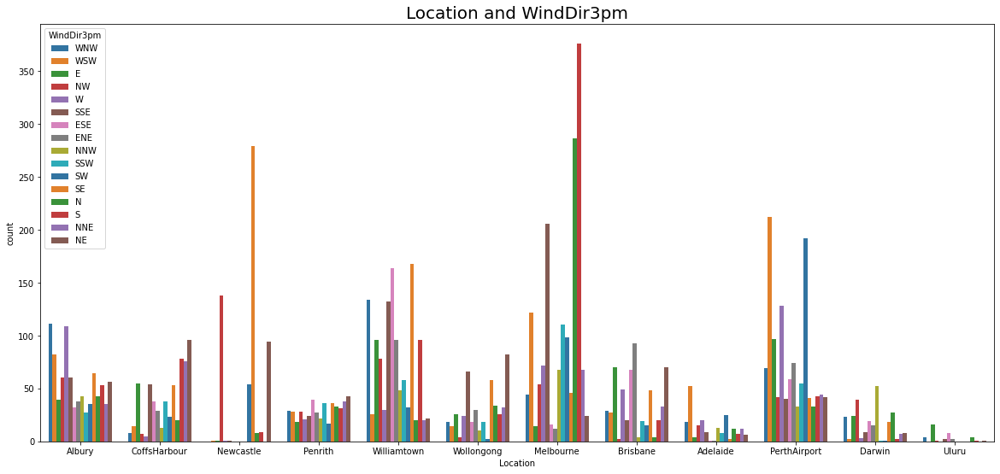

In [292]:
plt.figure(figsize=[20,9])
sns.countplot(rp["Location"], hue=rp["WindDir3pm"],palette='tab10')
plt.title("Location and WindDir3pm",fontsize=20)

Text(0.5, 1.0, 'Location and WindGustDir')

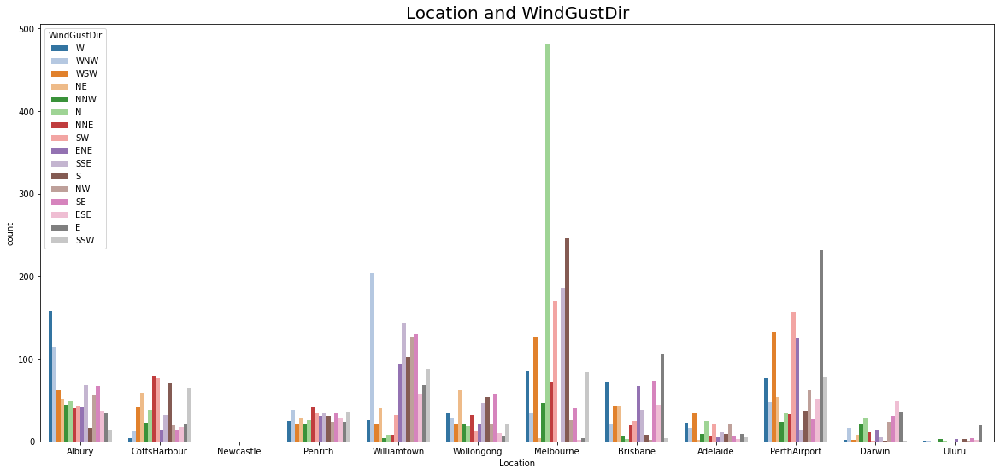

In [293]:
plt.figure(figsize=[20,9])
sns.countplot(rp["Location"], hue=rp["WindGustDir"],palette='tab20')
plt.title("Location and WindGustDir",fontsize=20)


### Observation-2
From the above results we can conclude that 

1) The prediction of Raintomorrow is the side of No(6195), means in most of the cases Rain will not fall tomorrow and the prediction of rain fall in ths side of yes(1991) is less as comapre to no.

2) The prediction of Raintoday is the side of No(6195), means in most of the cases Rain will not fall today and the prediction of rain fall in ths side of yes(1990) is less as comapre to No.

3) In our data set we have many locations, based on these locations we have to build our model.
    Locations names are Albur, CoffsHarbour, Newcastle, Penrith, Williamtown, Wollongong, Melbourne, Brisbane, Adelaide, PerthAirport, Darwin, Uluru.
    The Melbourne(1622), Williamtown(1230), PerthAirport(1204), Albury(907) and Newcastle(822) locations are higher in numbers as compare to others.Uluru(39) location is less present in our dataset.

4) The wind direction is also a important part for predicting a rainfall, Most of the time wind blows in north(713) direction.
    and very less time wind blows in NNW(219) direction.

5) Most of the time the direction of wind at 9 am is Northe(906), south west(704) and north west(625) side.

6) When we see the Prediction results of rain tomorrow with respect to location, we get the result that
    a) Most of the locations are having no rain tomorrow.
    b) Melbourne, williamtown and pearth airport locations showing yes, means rain will fall tomorrow.
    
7) Location and wind direction at 9 am shows that

a) In melbourne loaction the direction of wind at 9 am is NNW side in most of the time.

b) In williamtown loaction the direction of wind at 9 am is NW side in most of the time.

c) In pearth airport loaction the direction of wind at 9 am is ENE and south west side in most of the time.

d) In coffsharbour and brisbane loaction the direction of wind at 9 am is south west side in most of the time.

8) Location and wind direction at 3 pm shows that

a) In melbourne loaction the direction of wind at 3 pm is south side in most of the time.

b) In williamtown loaction the direction of wind at 3 pm is WSW, ESE and WNW side in most of the time.

c) In pearth airport loaction the direction of wind at 3 pm is WSW and WNW side in most of the time.

9) Location and wind Gust direction  shows that

a) In melbourne loaction the direction gust wind is North , SSE and West side in most of the time.

b) In williamtown loaction the direction gust wind is WNW and SSE side in most of the time.

c) In pearth airport loaction the direction gust wind is east, soutwest and WSW side in most of the time.

## Adopting imputation technique

In [294]:
from sklearn.impute import SimpleImputer

In [295]:
si=SimpleImputer(strategy='most_frequent')

In [296]:
null_col=['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow']

In [297]:
for i in null_col:
    rp[i]=si.fit_transform(rp[i].values.reshape(-1,1))

In [298]:
rp.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [299]:
rp.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,4.0,0.0,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,4.0,0.0,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,4.0,0.0,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,4.0,0.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,4.0,0.0,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


### Changing date column in the date time format

In [300]:
rp['Day']=pd.to_datetime(rp['Date'],format='%Y/%m/%d').dt.day

In [301]:
rp['Month']=pd.to_datetime(rp['Date'],format='%Y/%m/%d').dt.month
rp['Year']=pd.to_datetime(rp['Date'],format='%Y/%m/%d').dt.year

In [302]:
rp.drop(['Date'],axis=1,inplace=True)

In [303]:
rp.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.9,0.6,4.0,0.0,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.1,0.0,4.0,0.0,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.7,0.0,4.0,0.0,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.0,0.0,4.0,0.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.3,1.0,4.0,0.0,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,5,12,2008


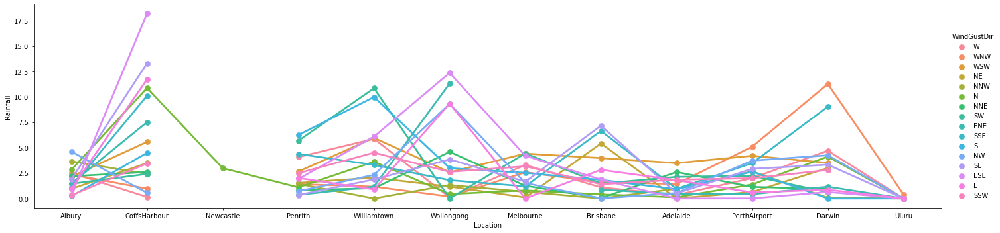

In [304]:
sns.factorplot(x='Location',y='Rainfall',hue='WindGustDir',aspect= 4, ci=None,data=rp)

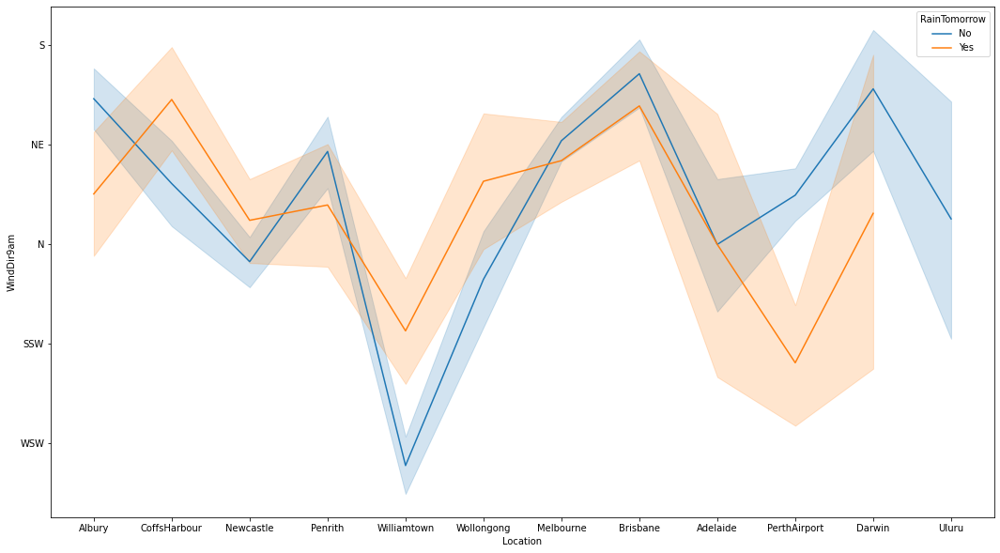

In [305]:
plt.figure(figsize=(18,10))
sns.lineplot(x="Location", y="WindDir9am", hue='RainTomorrow', data=rp)
plt.show()

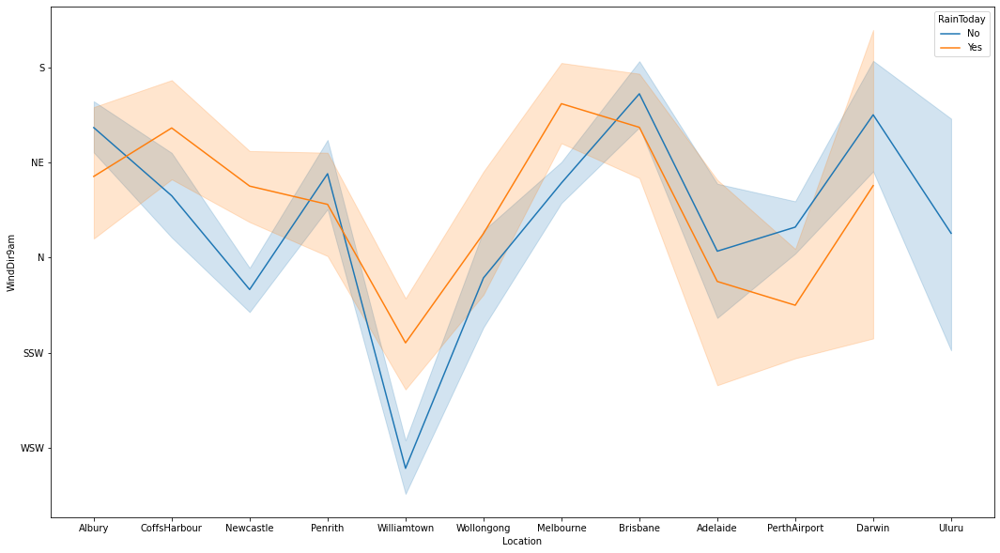

In [306]:
plt.figure(figsize=(18,10))
sns.lineplot(x="Location", y="WindDir9am", hue='RainToday', data=rp)
plt.show()

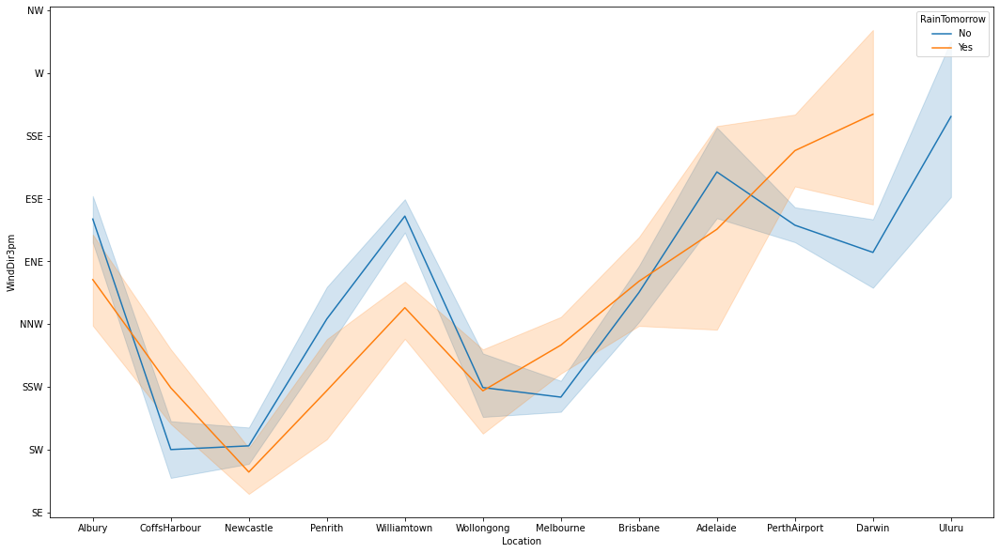

In [307]:
plt.figure(figsize=(18,10))
sns.lineplot(x="Location", y="WindDir3pm", hue='RainTomorrow', data=rp)
plt.show()

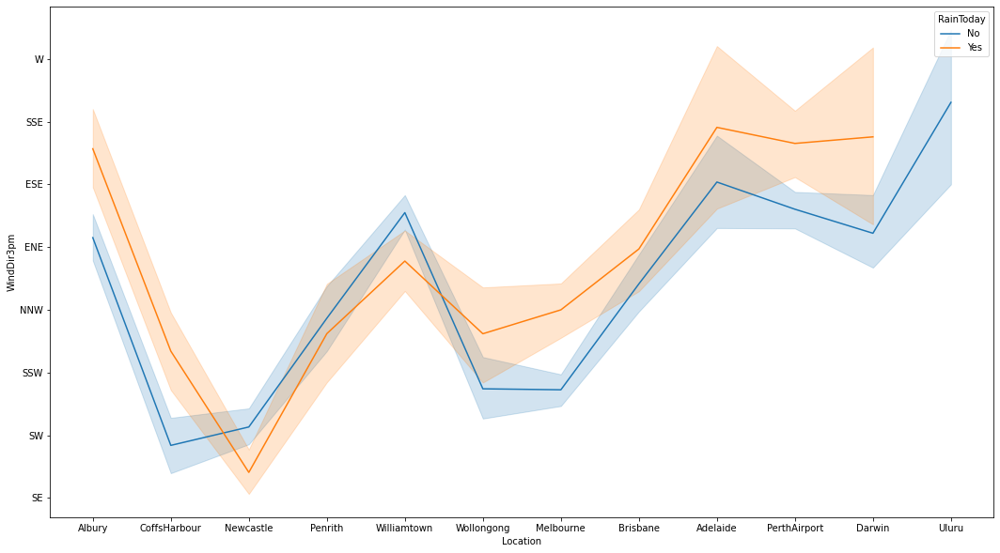

In [308]:
plt.figure(figsize=(18,10))
sns.lineplot(x="Location", y="WindDir3pm", hue='RainToday', data=rp)
plt.show()

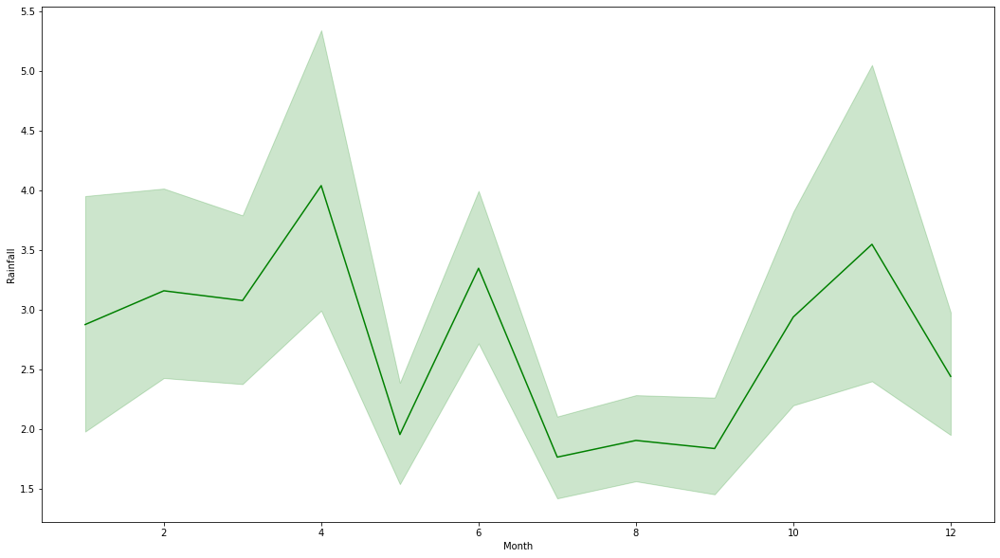

In [309]:
plt.figure(figsize=(18,10))
sns.lineplot(x="Month", y='Rainfall', data=rp,color='g')
plt.show()

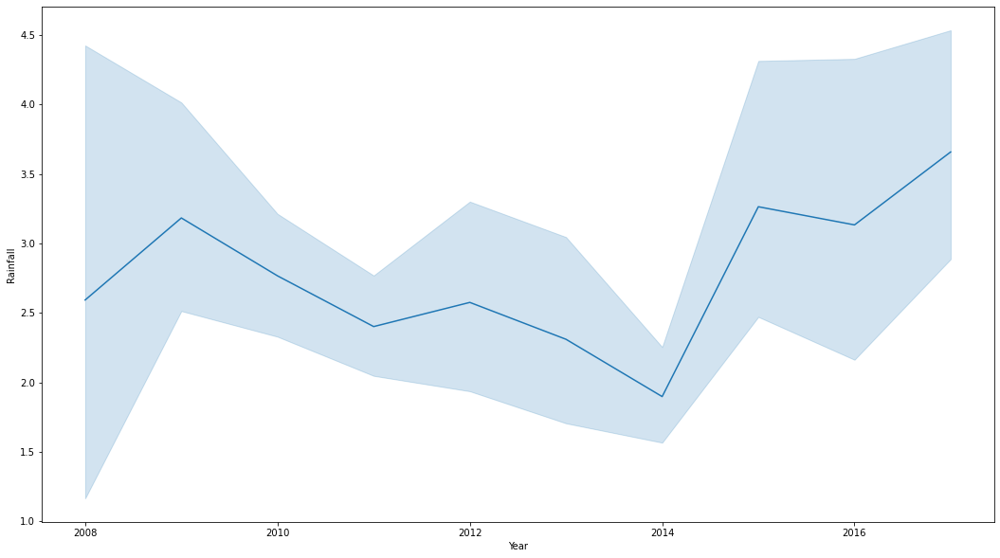

In [310]:
plt.figure(figsize=(18,10))
sns.lineplot(x="Year", y='Rainfall', data=rp)
plt.show()

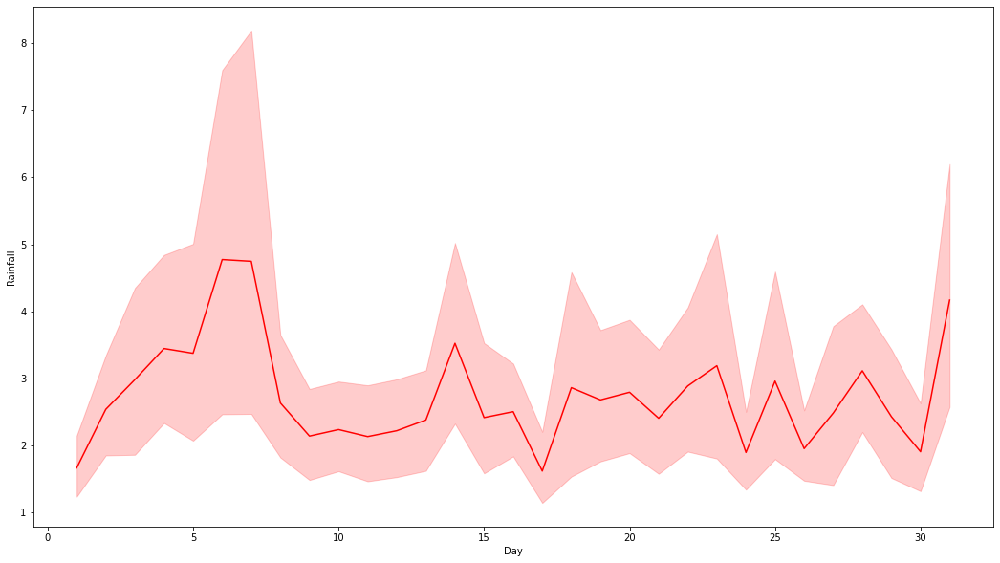

In [311]:
plt.figure(figsize=(18,10))
sns.lineplot(x="Day", y='Rainfall', data=rp,color='r')
plt.show()

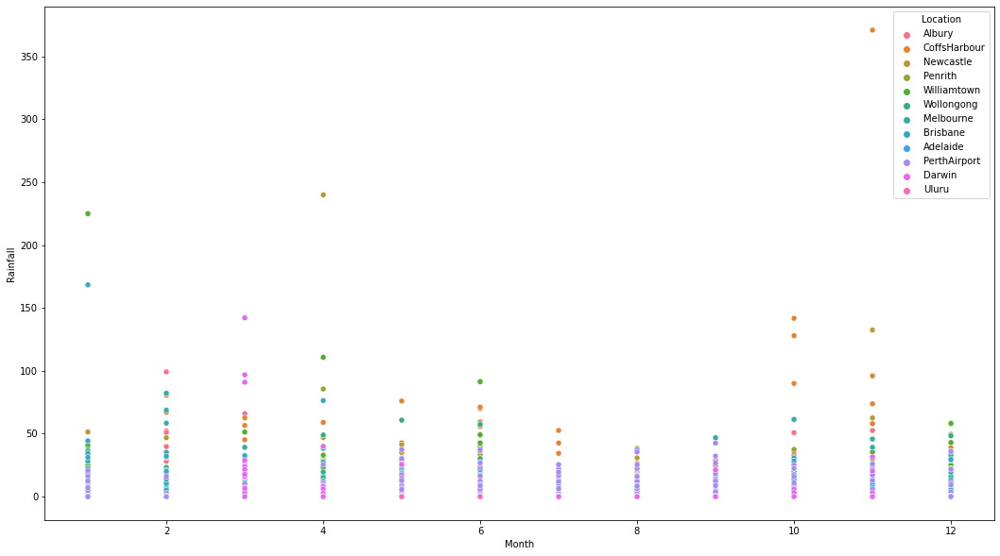

In [312]:
plt.figure(figsize=(18,10))
sns.scatterplot(x="Month", y='Rainfall',hue='Location', data=rp)
plt.show()

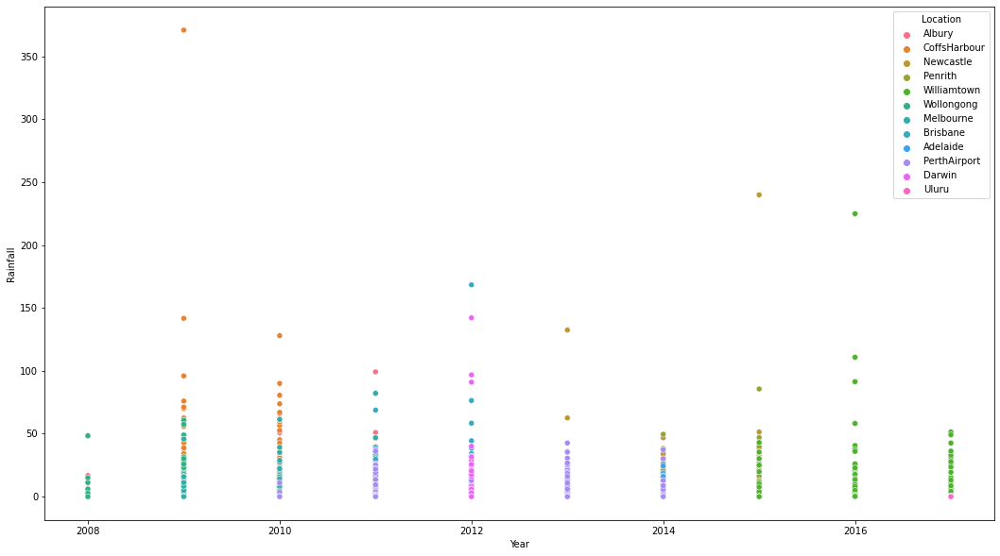

In [313]:
plt.figure(figsize=(18,10))
sns.scatterplot(x="Year", y='Rainfall',hue='Location', data=rp)
plt.show()

### Observation-4

From the above results we can say that :
    
1) We can see the heavy rain fall in the month april, june and december and very less in july, august and september.

2) The rain is falling more, in the year of 2009, 2015, 2016, 2017 and 2018.

3) In the month of march it rains heavily in the drawin location.

4) In the month of october and november it rains heavily in the coffsharbours location.

5) Above graphs shows that in most of the location the size of rain fall is less than 50 mm .

6) In the year 2009 and 2010, it rains heavily in the williamtown and coffsharbour location.

7) In the year 2012, it rains heavily in the darwin location.

8) In the year 2015, 2016 and 2017, it rains in william town location.

## Encoding the data using Ancoding technique

In [314]:
from sklearn.preprocessing import LabelEncoder

In [315]:
le=LabelEncoder()

In [316]:
obj_col=['Location','WindGustDir','WindDir9am','WindDir3pm','RainToday','RainTomorrow']

In [317]:
for i in obj_col:
    rp[i]=le.fit_transform(rp[i])

In [318]:
rp.dtypes

Location           int32
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir        int32
WindGustSpeed    float64
WindDir9am         int32
WindDir3pm         int32
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday          int32
RainTomorrow       int32
Day                int64
Month              int64
Year               int64
dtype: object

In [319]:
rp.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,22.9,0.6,4.0,0.0,13,44.0,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,0,0,1,12,2008
1,1,7.4,25.1,0.0,4.0,0.0,14,44.0,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,0,0,2,12,2008
2,1,12.9,25.7,0.0,4.0,0.0,15,46.0,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,0,0,3,12,2008
3,1,9.2,28.0,0.0,4.0,0.0,4,24.0,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,0,0,4,12,2008
4,1,17.5,32.3,1.0,4.0,0.0,13,41.0,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0,5,12,2008


## Checking outliers

In [320]:
rp.describe()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,5.793591,13.182682,23.825365,2.725982,4.810220,4.014042,7.217804,40.036320,7.267418,7.810445,13.803917,18.412582,67.858754,51.295193,1017.198944,1015.635347,5.265875,5.230742,17.742326,22.405982,0.236202,0.236320,15.741958,6.442136,2012.102433
std,3.162654,5.380656,6.128159,10.319872,3.912448,4.744297,4.702616,13.781296,4.588045,4.430162,10.138945,9.763307,16.779787,18.316487,6.359552,6.286580,2.667166,2.564122,5.613463,5.955804,0.424773,0.424846,8.787354,3.437994,2.473137
min,0.000000,-2.000000,8.200000,0.000000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,0.000000,0.000000,1.000000,1.000000,2008.000000
25%,3.000000,9.300000,19.200000,0.000000,4.000000,0.000000,3.000000,31.000000,3.000000,4.000000,6.000000,11.000000,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000,0.000000,0.000000,8.000000,3.000000,2010.000000
50%,6.000000,13.200000,23.200000,0.000000,4.000000,0.200000,7.000000,39.000000,7.000000,8.000000,13.000000,19.000000,68.000000,51.000000,1016.100000,1017.000000,7.000000,7.000000,17.700000,21.800000,0.000000,0.000000,16.000000,6.000000,2011.000000
75%,8.000000,17.300000,28.000000,0.800000,5.200000,8.900000,12.000000,48.000000,12.000000,11.000000,20.000000,24.000000,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000,0.000000,0.000000,23.000000,9.000000,2014.000000
max,11.000000,28.500000,45.500000,371.000000,145.000000,13.900000,15.000000,107.000000,15.000000,15.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,1.000000,1.000000,31.000000,12.000000,2017.000000


Location            AxesSubplot(0.125,0.657941;0.168478x0.222059)
MinTemp          AxesSubplot(0.327174,0.657941;0.168478x0.222059)
MaxTemp          AxesSubplot(0.529348,0.657941;0.168478x0.222059)
Rainfall         AxesSubplot(0.731522,0.657941;0.168478x0.222059)
Evaporation         AxesSubplot(0.125,0.391471;0.168478x0.222059)
Sunshine         AxesSubplot(0.327174,0.391471;0.168478x0.222059)
WindGustDir      AxesSubplot(0.529348,0.391471;0.168478x0.222059)
WindGustSpeed    AxesSubplot(0.731522,0.391471;0.168478x0.222059)
WindDir9am             AxesSubplot(0.125,0.125;0.168478x0.222059)
WindDir3pm          AxesSubplot(0.327174,0.125;0.168478x0.222059)
WindSpeed9am        AxesSubplot(0.529348,0.125;0.168478x0.222059)
WindSpeed3pm        AxesSubplot(0.731522,0.125;0.168478x0.222059)
dtype: object

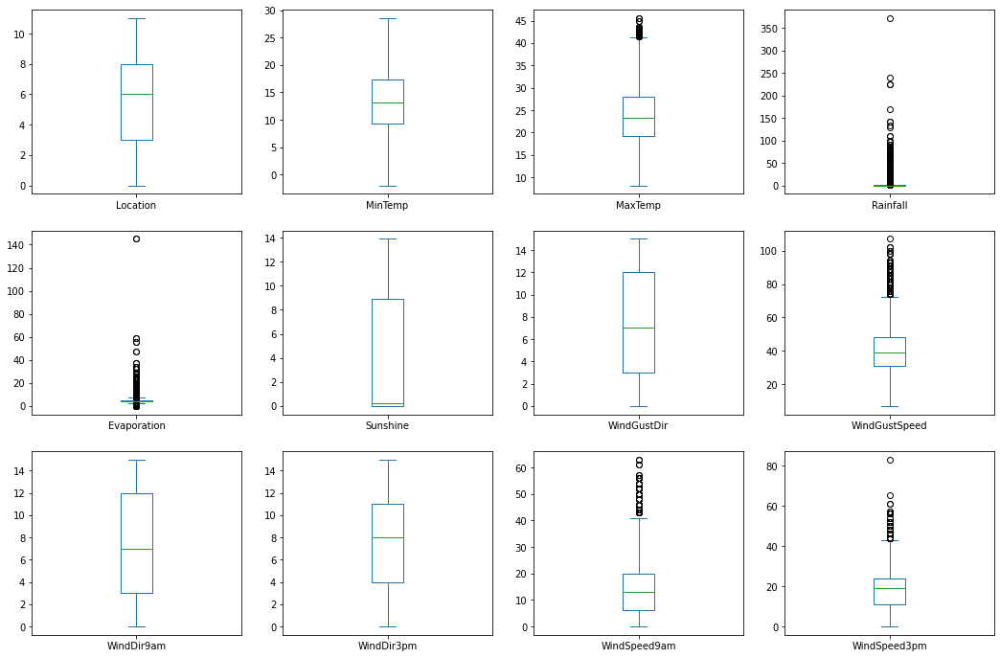

In [321]:
rp.iloc[:,0:12].plot(kind='box',subplots=True,figsize=[18,12],layout=(3,4))

Humidity9am        AxesSubplot(0.125,0.749828;0.227941x0.130172)
Humidity3pm     AxesSubplot(0.398529,0.749828;0.227941x0.130172)
Pressure9am     AxesSubplot(0.672059,0.749828;0.227941x0.130172)
Pressure3pm        AxesSubplot(0.125,0.593621;0.227941x0.130172)
Cloud9am        AxesSubplot(0.398529,0.593621;0.227941x0.130172)
Cloud3pm        AxesSubplot(0.672059,0.593621;0.227941x0.130172)
Temp9am            AxesSubplot(0.125,0.437414;0.227941x0.130172)
Temp3pm         AxesSubplot(0.398529,0.437414;0.227941x0.130172)
RainToday       AxesSubplot(0.672059,0.437414;0.227941x0.130172)
RainTomorrow       AxesSubplot(0.125,0.281207;0.227941x0.130172)
Day             AxesSubplot(0.398529,0.281207;0.227941x0.130172)
Month           AxesSubplot(0.672059,0.281207;0.227941x0.130172)
Year                  AxesSubplot(0.125,0.125;0.227941x0.130172)
dtype: object

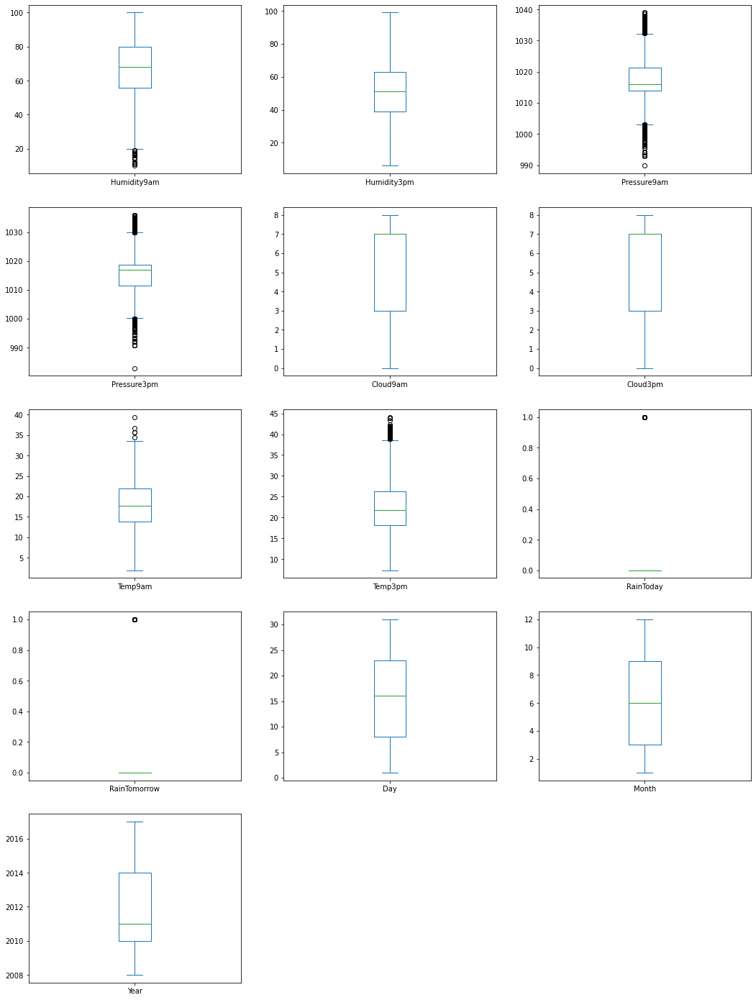

In [322]:
rp.iloc[:,12:].plot(kind='box',subplots=True,figsize=[18,25],layout=(5,3))

### Observation-5

From the above boxplots and description we can conclude that 

1) In the maxtemp column some outliers are present as we can see the diffrence between maxtemp and standard daviation is high.

2) In the rainfall and evaporation column outliers are present because the diffrence between mean values and maximum value is too big, Mean is 2.7 and max values is 371 in the rainfall column, similarly in the evaporation column mean is 4.8 and max values is 145.

3) Similarly in the windgustspeed, windspeed9am and windspeed3pm columns the data are highly skewded and outliers are present also.

4) The chances of outliers are also present in pressureat3pm, pressureat9am and humidity column.

To remove the outliers from the columns we will use z-score method.

## Checking Skewness

In [323]:
from scipy.stats import skew

In [324]:
rp.skew()

Location         -0.050456
MinTemp          -0.084104
MaxTemp           0.391512
Rainfall         13.200523
Evaporation      13.812740
Sunshine          0.606448
WindGustDir       0.119640
WindGustSpeed     0.786153
WindDir9am        0.172792
WindDir3pm       -0.119847
WindSpeed9am      0.969604
WindSpeed3pm      0.510765
Humidity9am      -0.262767
Humidity3pm       0.110858
Pressure9am       0.171566
Pressure3pm      -0.190150
Cloud9am         -0.863322
Cloud3pm         -0.804407
Temp9am          -0.005160
Temp3pm           0.412119
RainToday         1.242362
RainTomorrow      1.241588
Day               0.004260
Month             0.039388
Year              0.418663
dtype: float64

Location
-0.050447350333250936


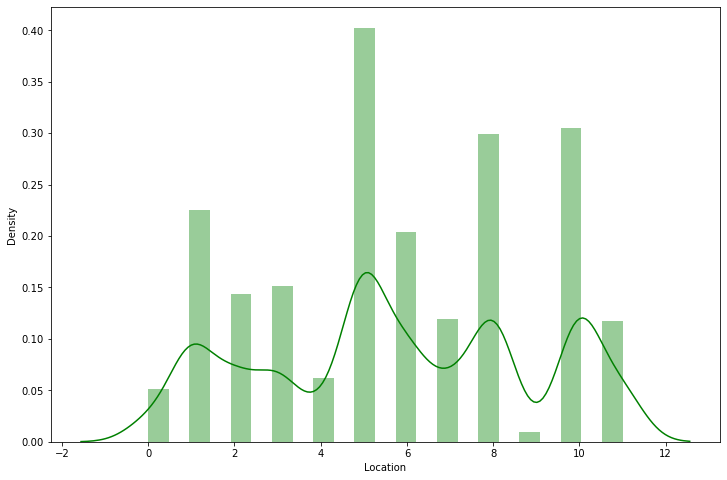

MinTemp
-0.08408873269396665


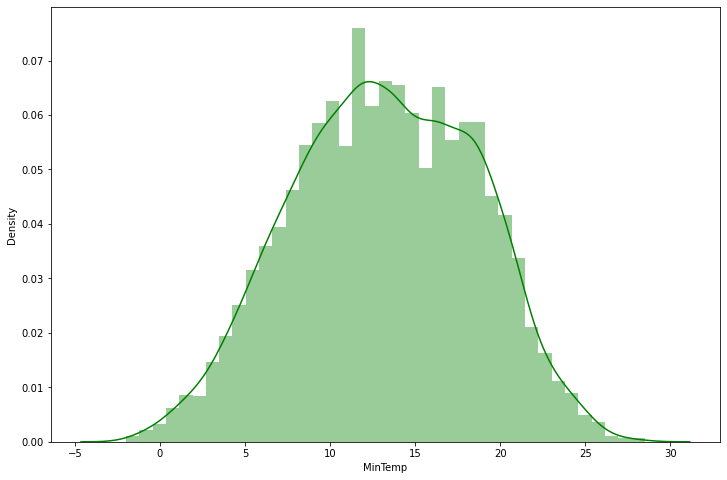

MaxTemp
0.3914421679397888


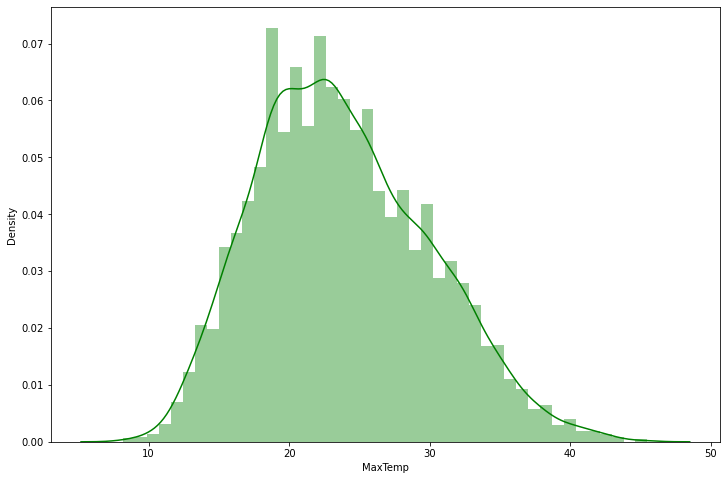

Rainfall
13.19817230394766


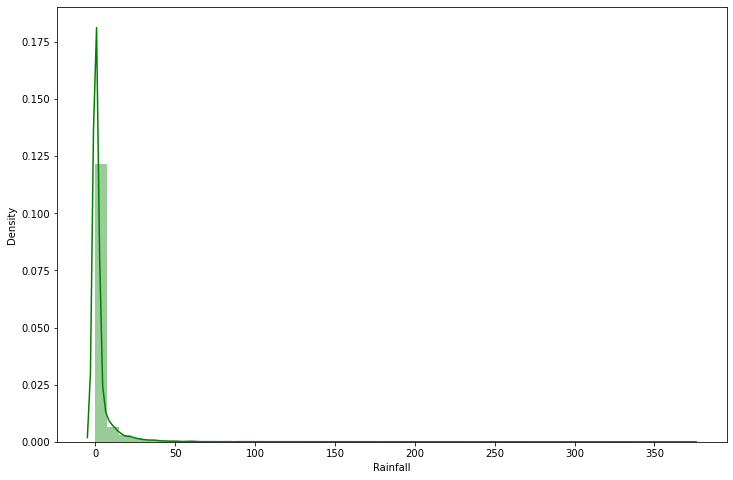

Evaporation
13.810280576100775


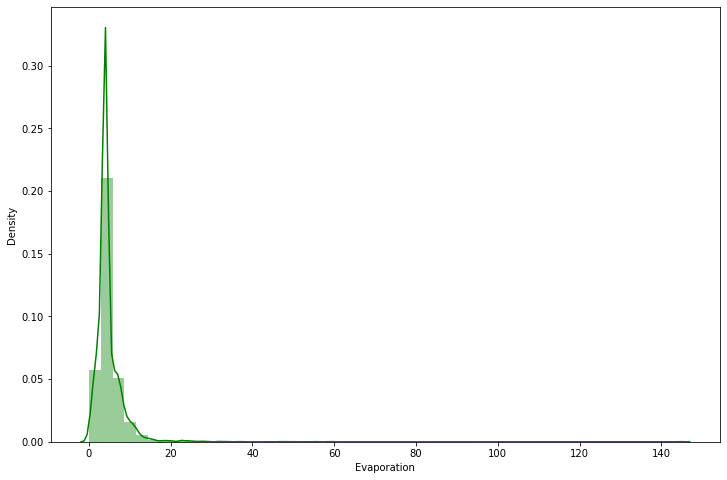

Sunshine
0.6063395623359631


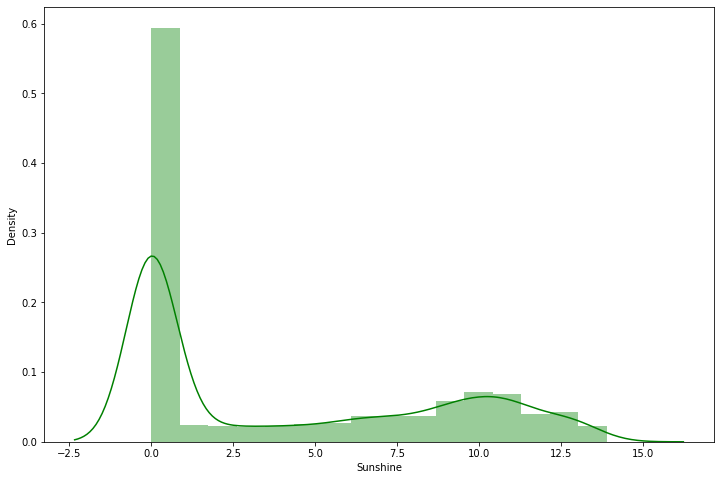

WindGustDir
0.11961861088690802


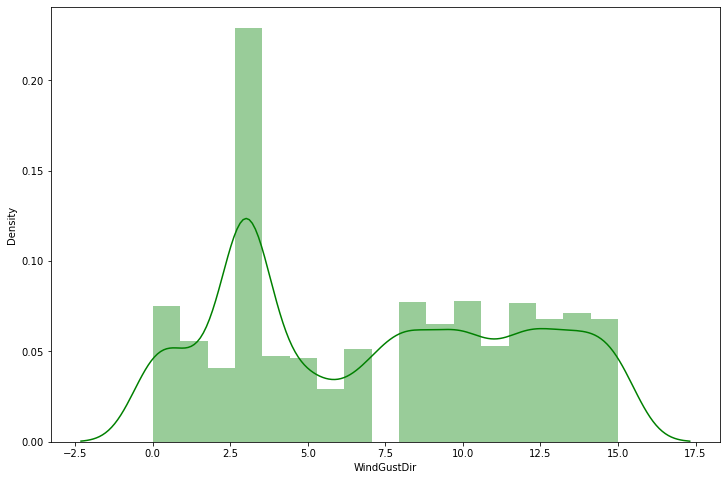

WindGustSpeed
0.7860129285473769


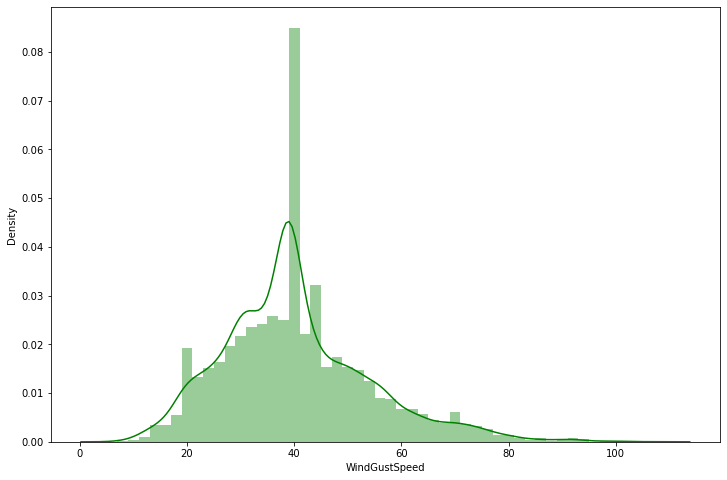

WindDir9am
0.17276085398677393


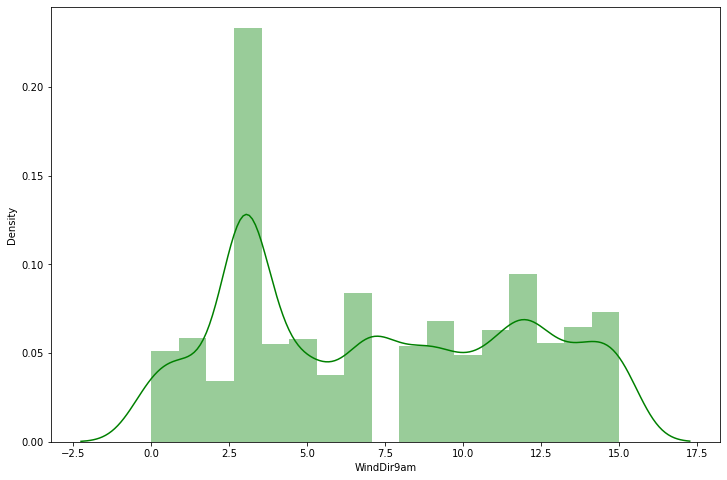

WindDir3pm
-0.11982569969826055


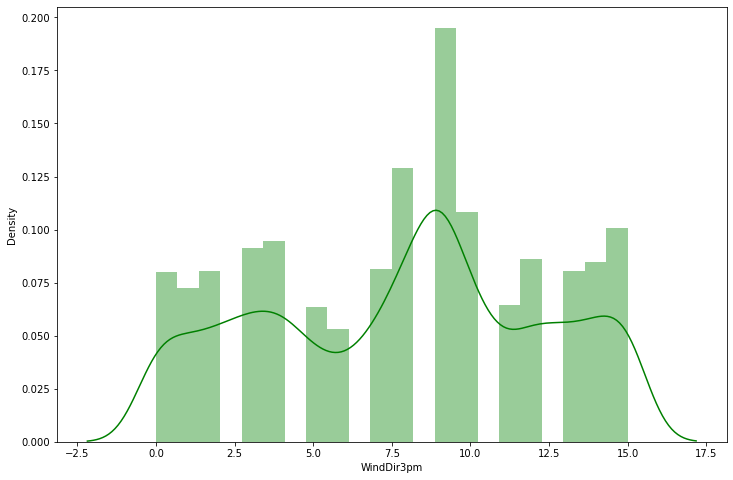

WindSpeed9am
0.9694310131944488


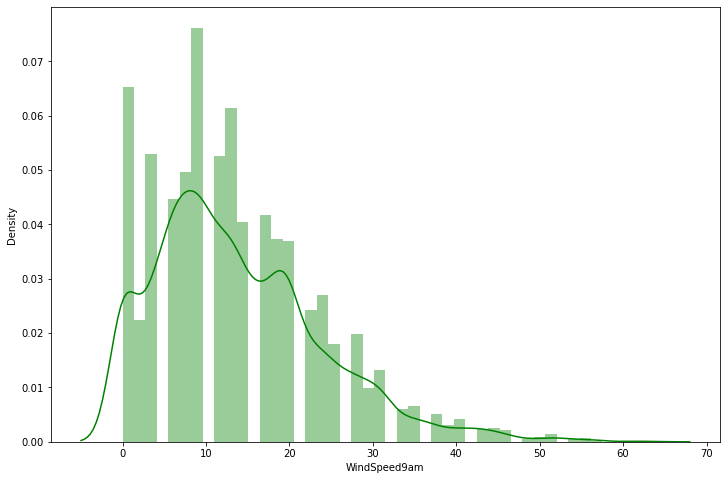

WindSpeed3pm
0.5106739838421255


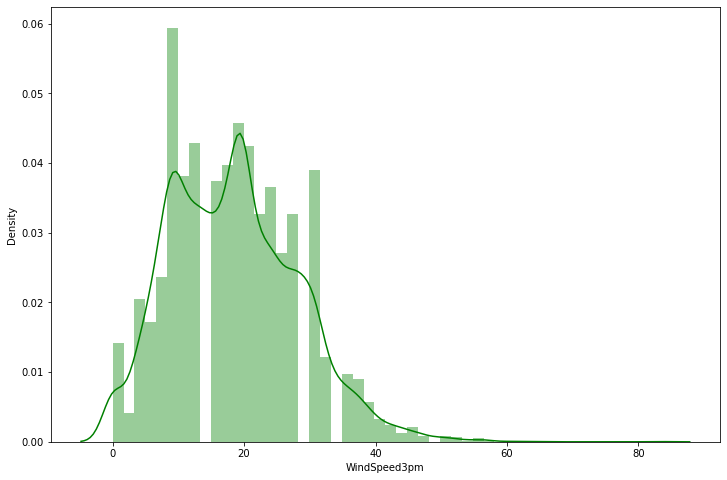

Humidity9am
-0.2627198627332039


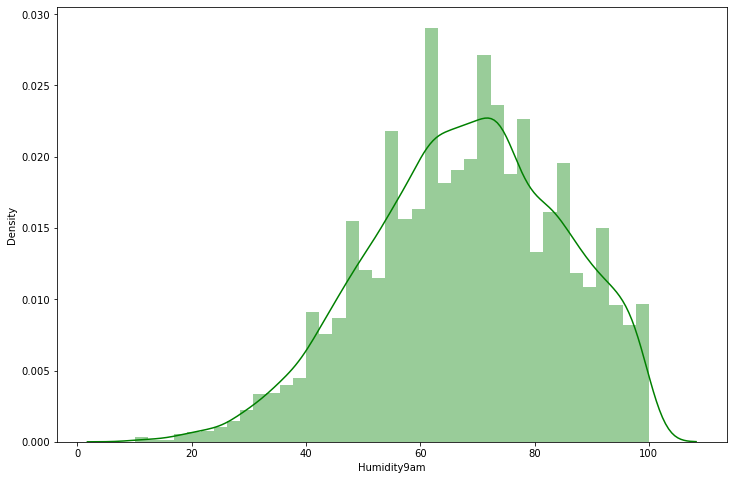

Humidity3pm
0.1108380344380952


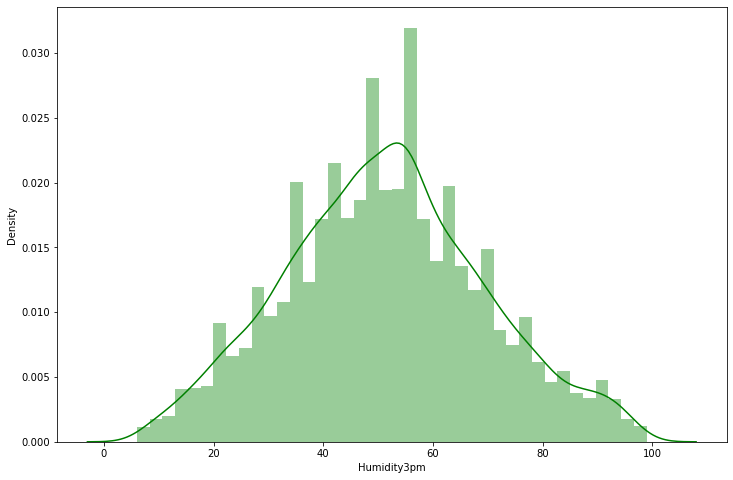

Pressure9am
0.17153555733700807


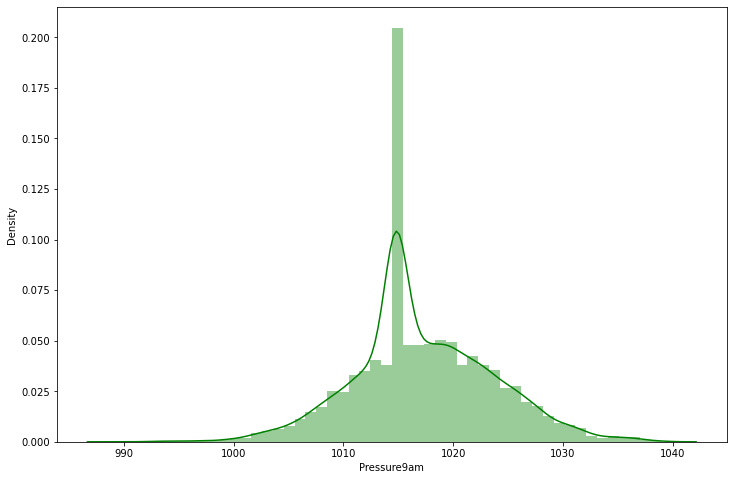

Pressure3pm
-0.19011590124372946


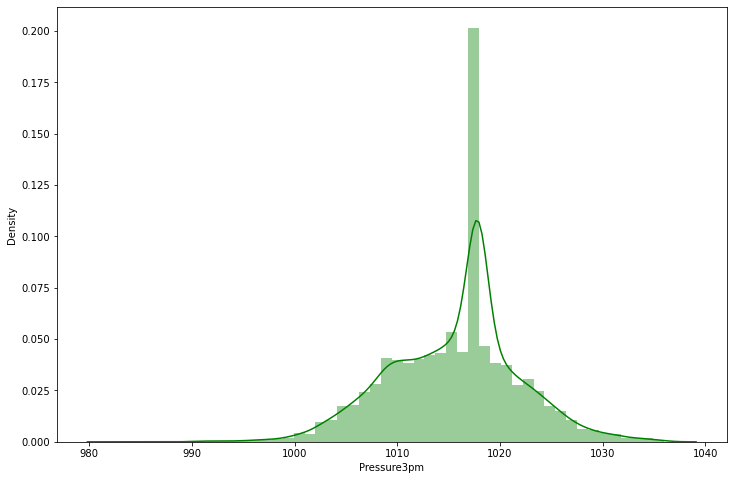

Cloud9am
-0.8631682147755737


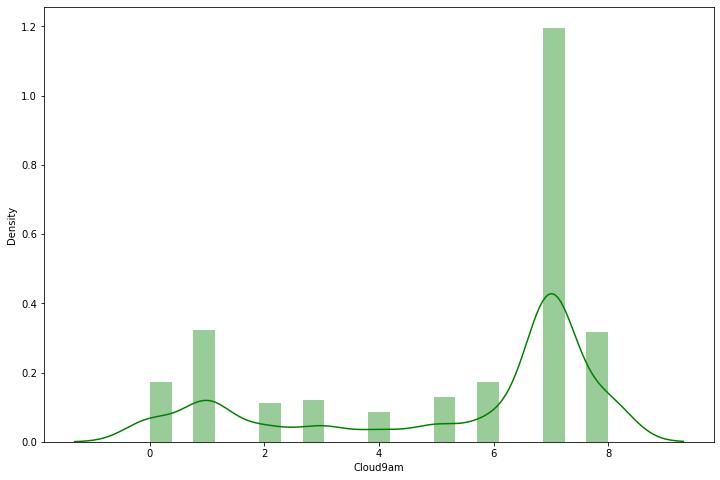

Cloud3pm
-0.8042636064261048


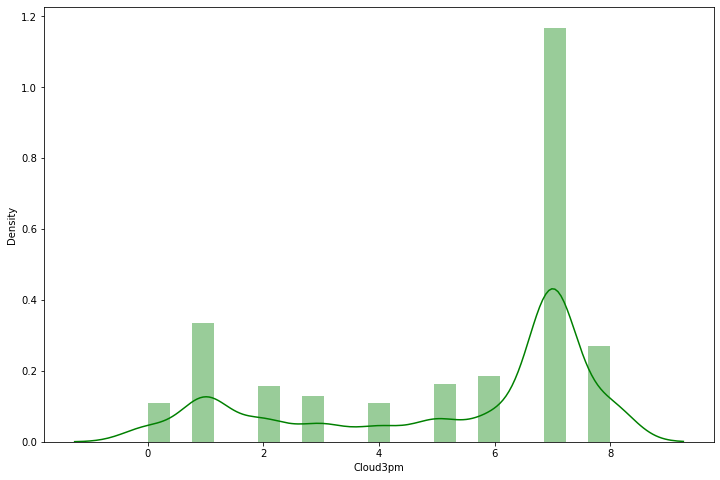

Temp9am
-0.005158777701563971


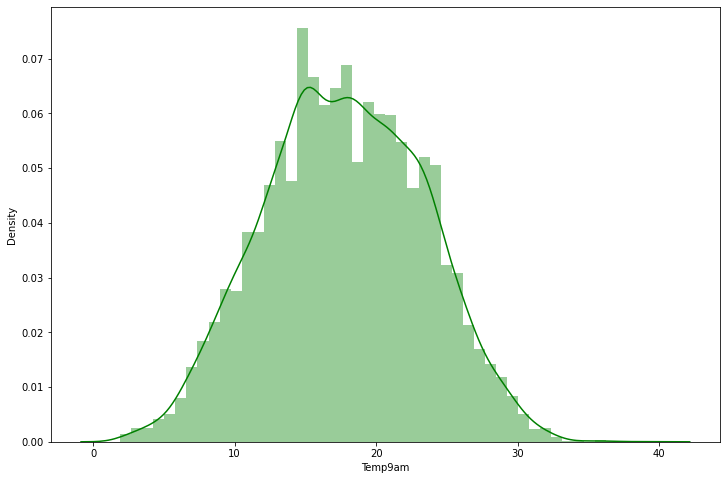

Temp3pm
0.4120459710803452


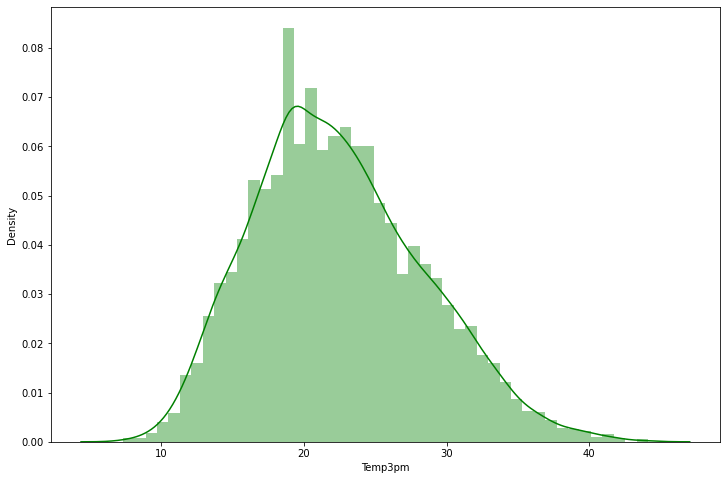

RainToday
1.2421411558091342


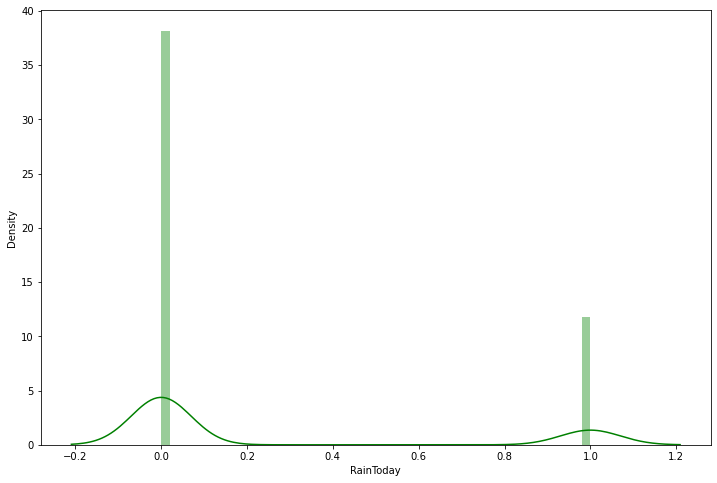

RainTomorrow
1.2413668823811346


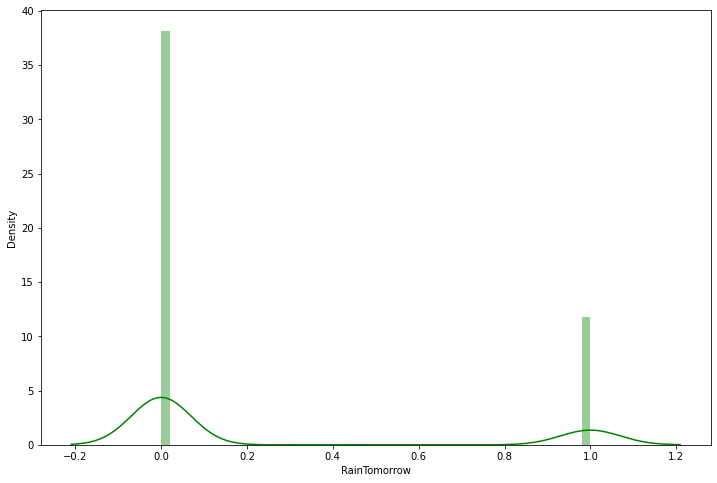

Day
0.0042591931033541695


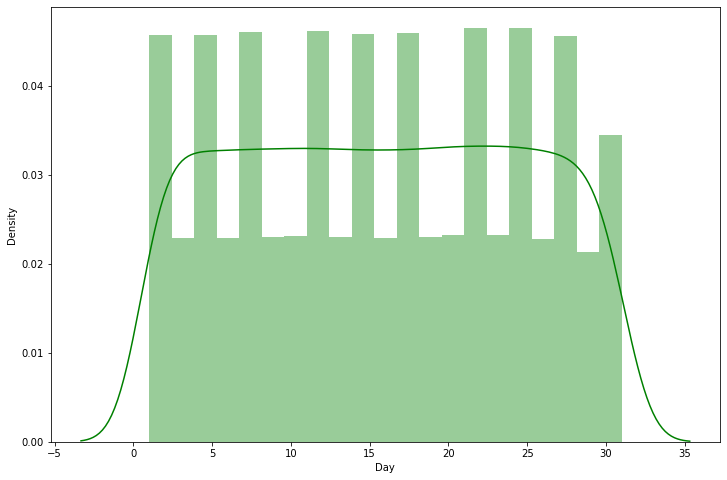

Month
0.039381052870507104


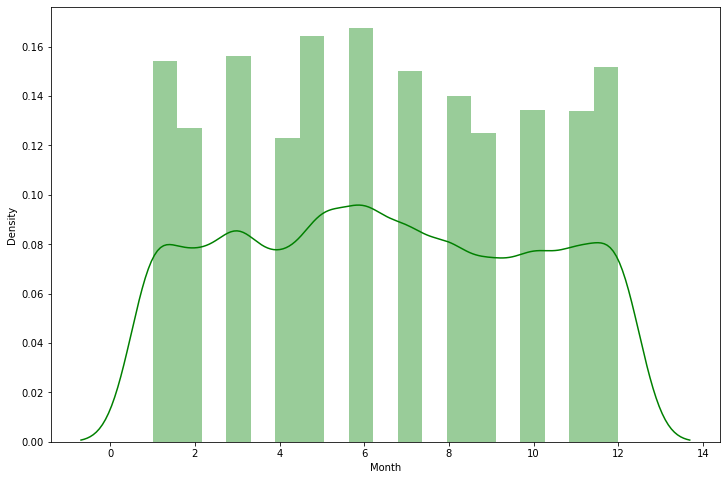

Year
0.41858833449642024


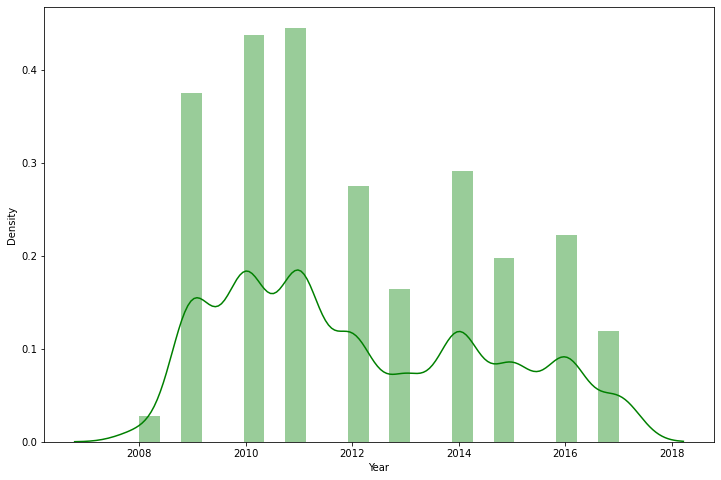

In [325]:
for i in rp:
    print(i)
    print(skew(rp[i]))
    
    plt.figure(figsize=[12,8])
    sns.distplot(rp[i],color='g')
    plt.show()

### Observation-6

From the above results we can say that some skewness is present in our data...

1) As we can see in the Rainfall and Evaporation column high skewness is present in these columns and in both the cases, mean is grater than median(50%).

2) Sunshine and windgustspeed columns have skewness which shows that the data are skewed in this columns.

3) Similarly in the windspeedAt9am, cloud9am and cloud3pm columns have skewed data, because the mean is greater than median value which increase the chances of skewness in the columns.

## Checking Correlation

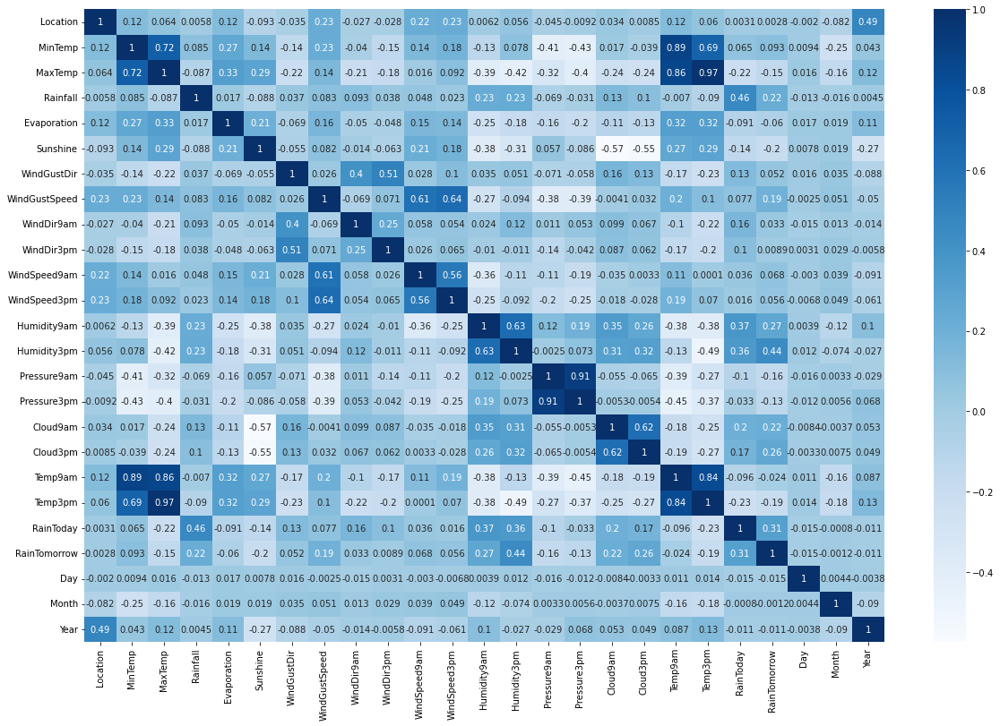

In [327]:
plt.figure(figsize=[20,13])
sns.heatmap(rp.corr(),annot=True,cmap='Blues')
plt.show()

<AxesSubplot:>

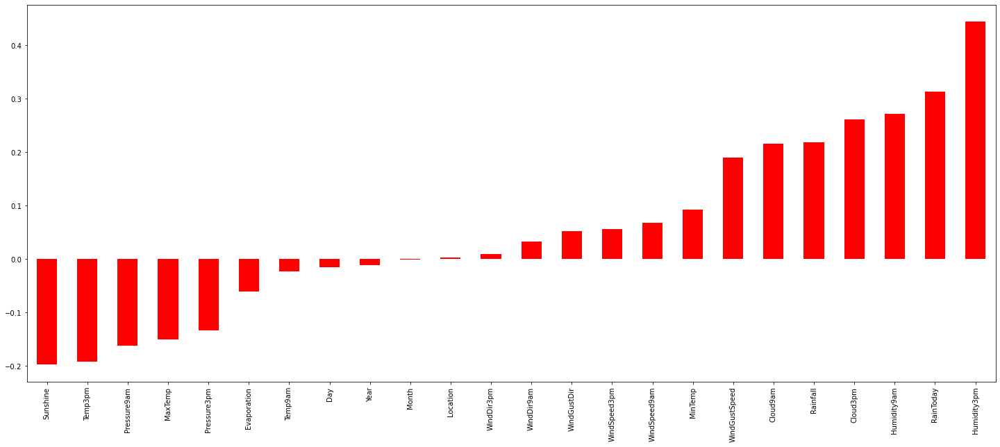

In [328]:
plt.figure(figsize=[25,10])
rp.corr()['RainTomorrow'].sort_values().drop(['RainTomorrow']).plot(kind='bar',color='r')

<AxesSubplot:>

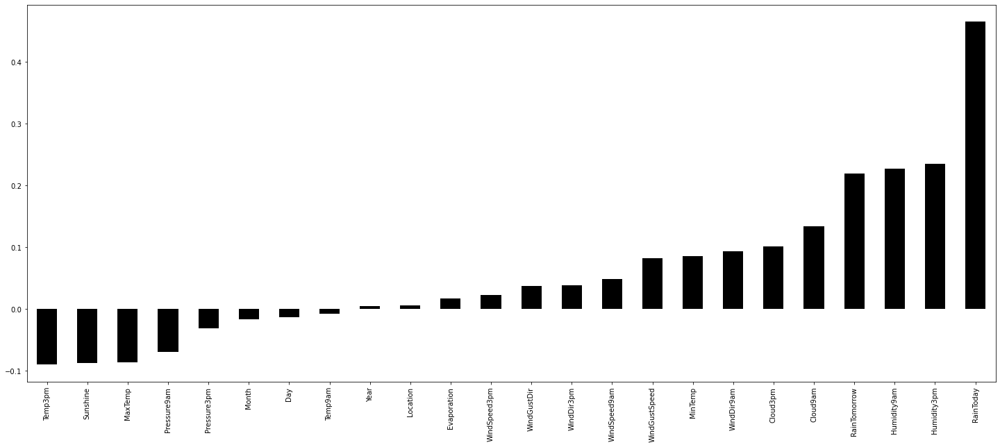

In [329]:
plt.figure(figsize=[25,10])
rp.corr()['Rainfall'].sort_values().drop(['Rainfall']).plot(kind='bar',color='black')

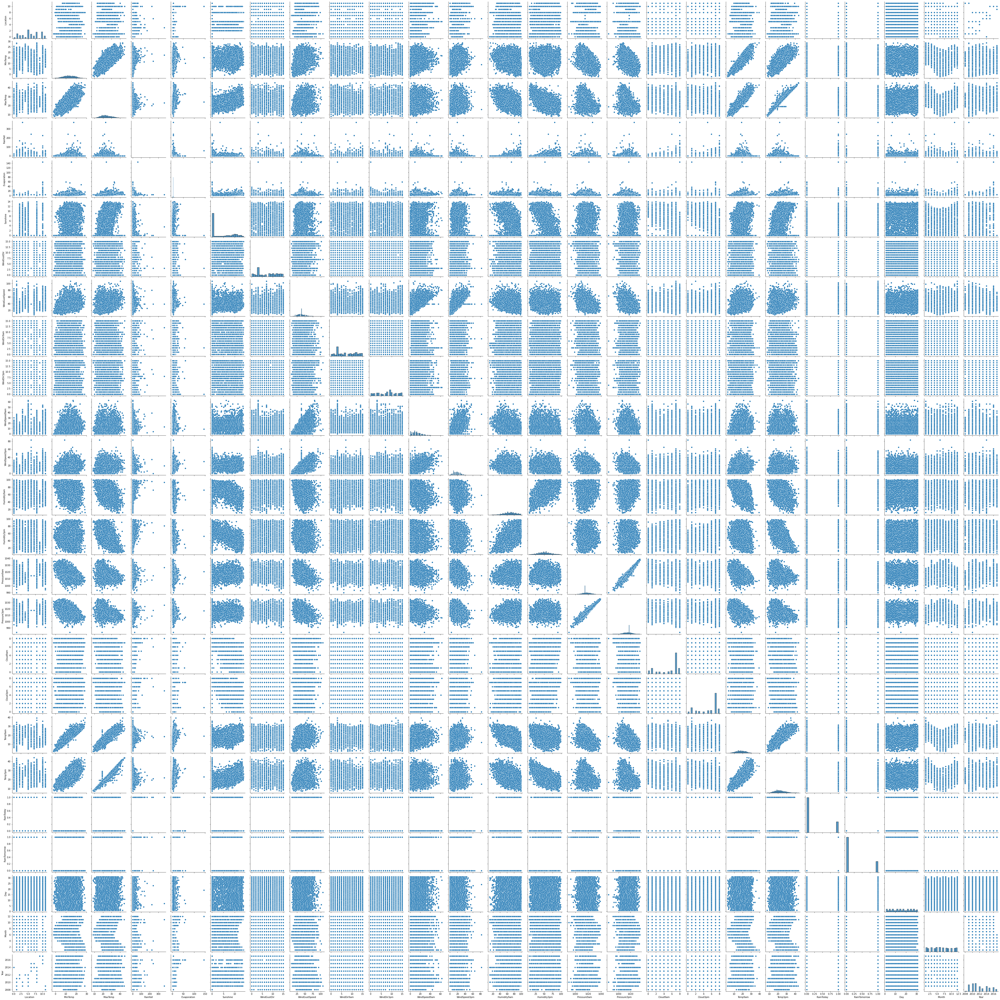

In [330]:
sns.pairplot(rp)
plt.show()

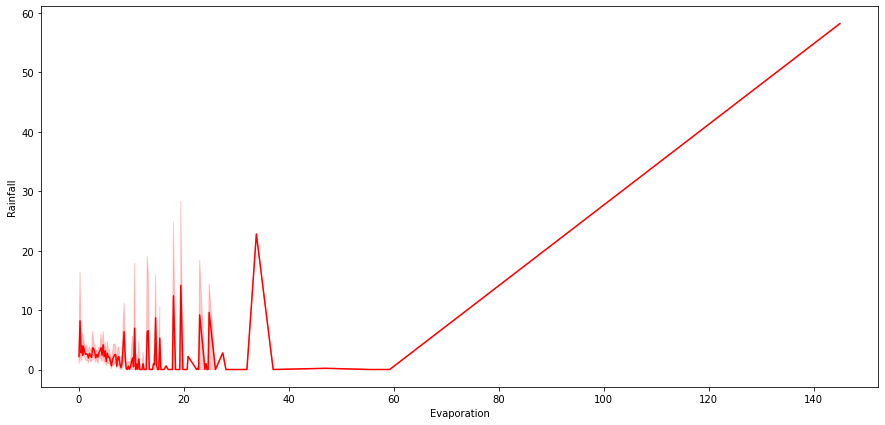

In [331]:
plt.figure(figsize=(15,7))
sns.lineplot(x="Evaporation", y='Rainfall', data=rp,color='r')
plt.show()

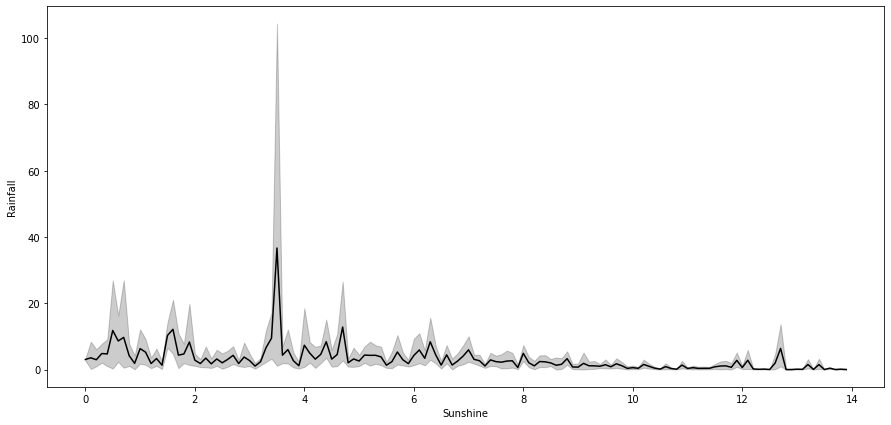

In [332]:
plt.figure(figsize=(15,7))
sns.lineplot(x="Sunshine", y='Rainfall', data=rp,color='black')
plt.show()

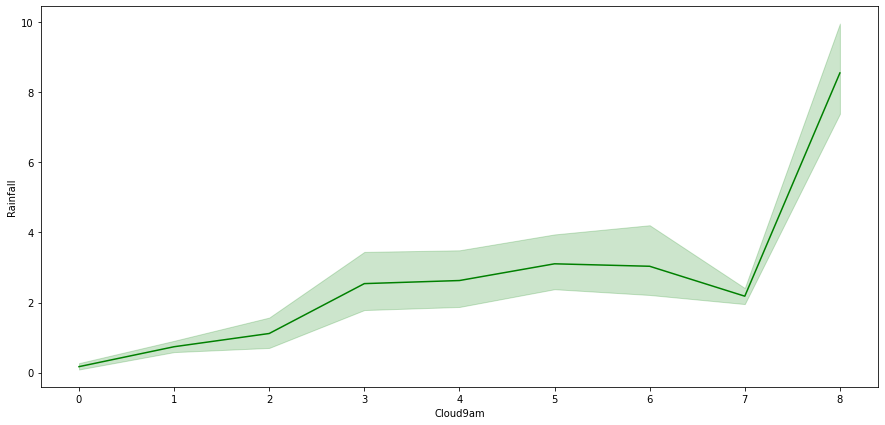

In [333]:
plt.figure(figsize=(15,7))
sns.lineplot(x="Cloud9am", y='Rainfall', data=rp,color='g')
plt.show()

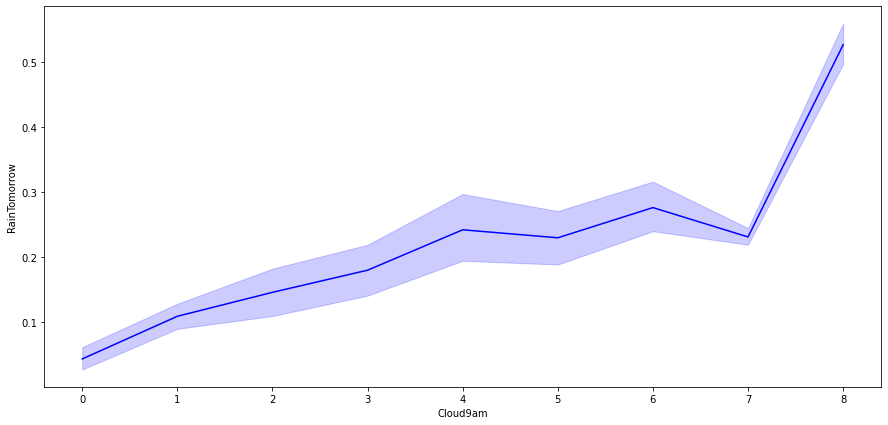

In [334]:
plt.figure(figsize=(15,7))
sns.lineplot(x="Cloud9am", y='RainTomorrow', data=rp,color='b')
plt.show()

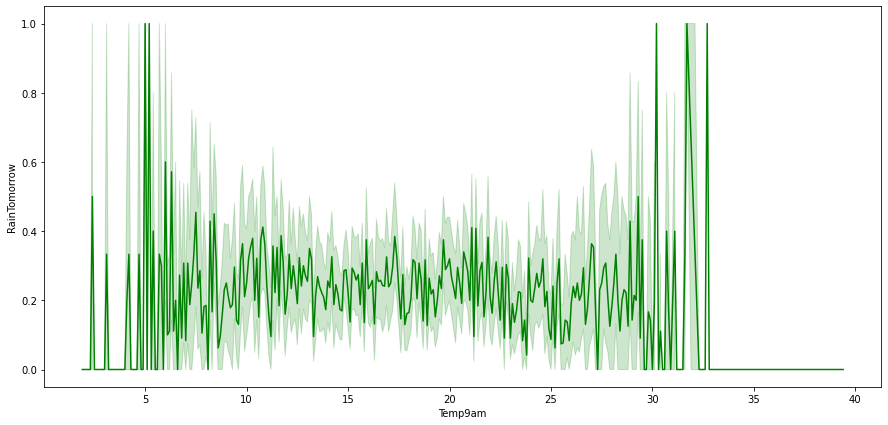

In [335]:
plt.figure(figsize=(15,7))
sns.lineplot(x="Temp9am", y='RainTomorrow', data=rp,color='g')
plt.show()

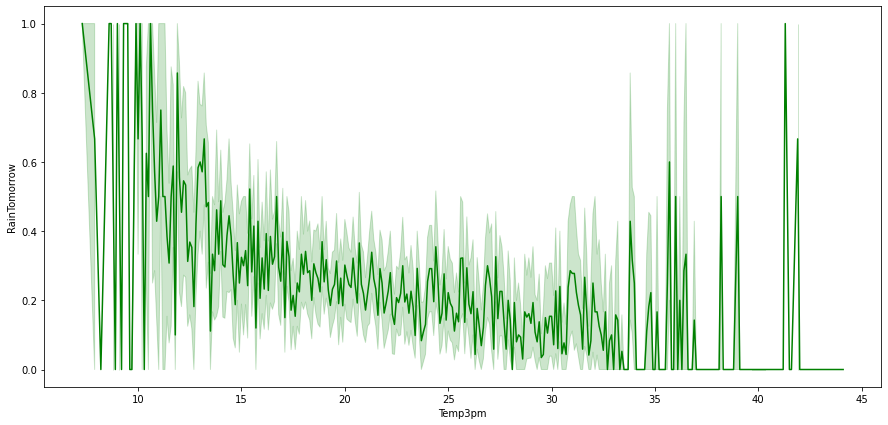

In [336]:
plt.figure(figsize=(15,7))
sns.lineplot(x="Temp3pm", y='RainTomorrow', data=rp,color='g')
plt.show()

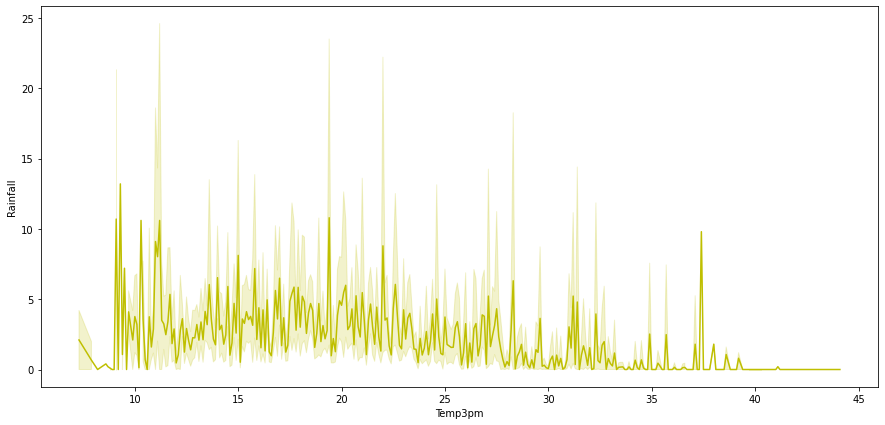

In [337]:
plt.figure(figsize=(15,7))
sns.lineplot(x="Temp3pm", y='Rainfall', data=rp,color='y')
plt.show()

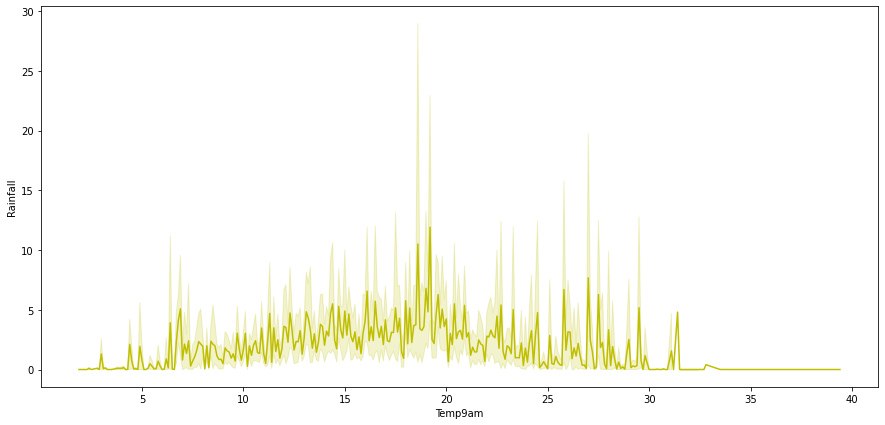

In [338]:
plt.figure(figsize=(15,7))
sns.lineplot(x="Temp9am", y='Rainfall', data=rp,color='y')
plt.show()

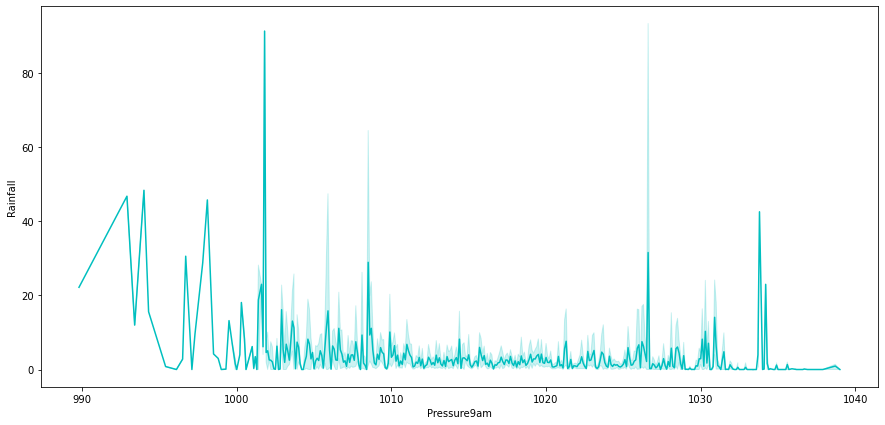

In [339]:
plt.figure(figsize=(15,7))
sns.lineplot(x="Pressure9am", y='Rainfall', data=rp,color='c')
plt.show()

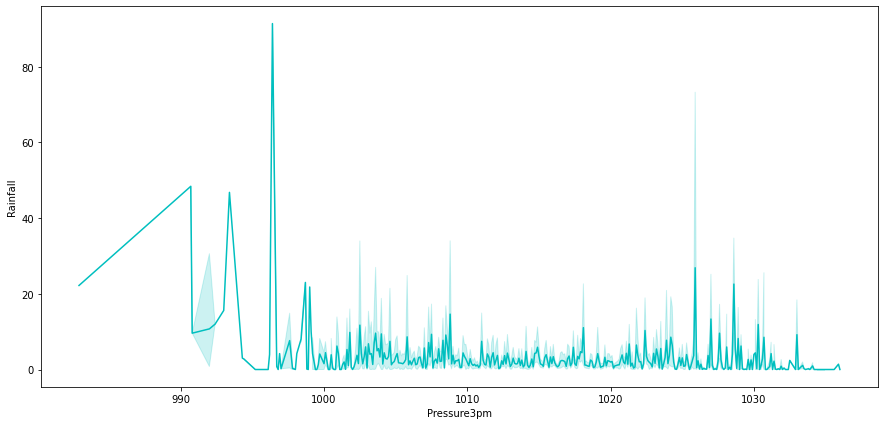

In [340]:
plt.figure(figsize=(15,7))
sns.lineplot(x="Pressure3pm", y='Rainfall', data=rp,color='c')
plt.show()

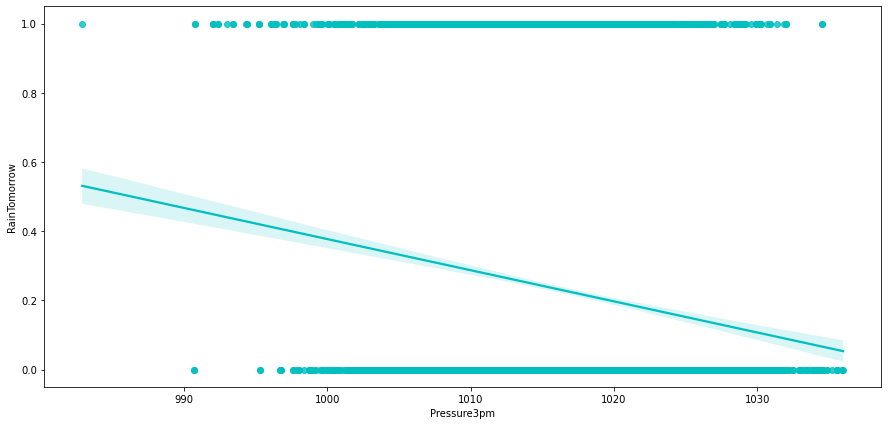

In [341]:
plt.figure(figsize=(15,7))
sns.regplot(x="Pressure3pm", y='RainTomorrow', data=rp,color='c')
plt.show()

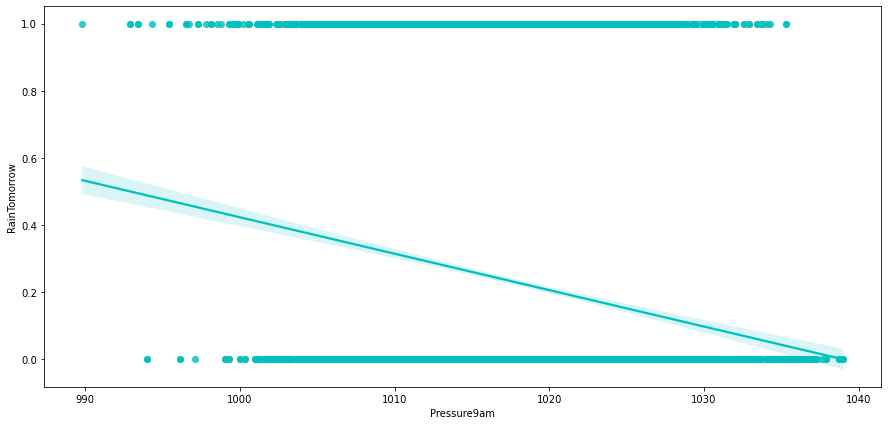

In [342]:
plt.figure(figsize=(15,7))
sns.regplot(x="Pressure9am", y='RainTomorrow', data=rp,color='c')
plt.show()

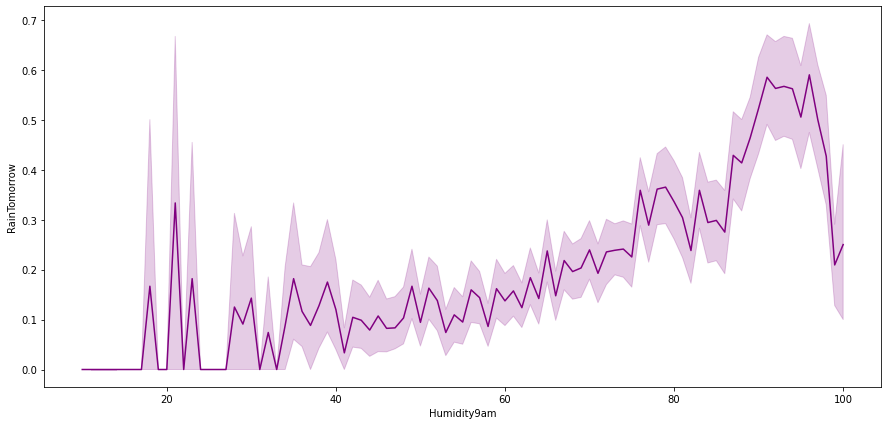

In [343]:
plt.figure(figsize=(15,7))
sns.lineplot(x="Humidity9am", y='RainTomorrow', data=rp,color='purple')
plt.show()

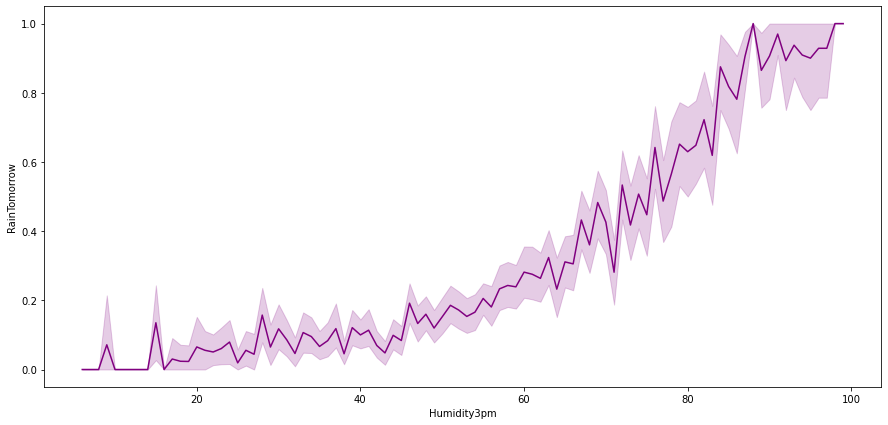

In [344]:
plt.figure(figsize=(15,7))
sns.lineplot(x="Humidity3pm", y='RainTomorrow', data=rp,color='purple')
plt.show()

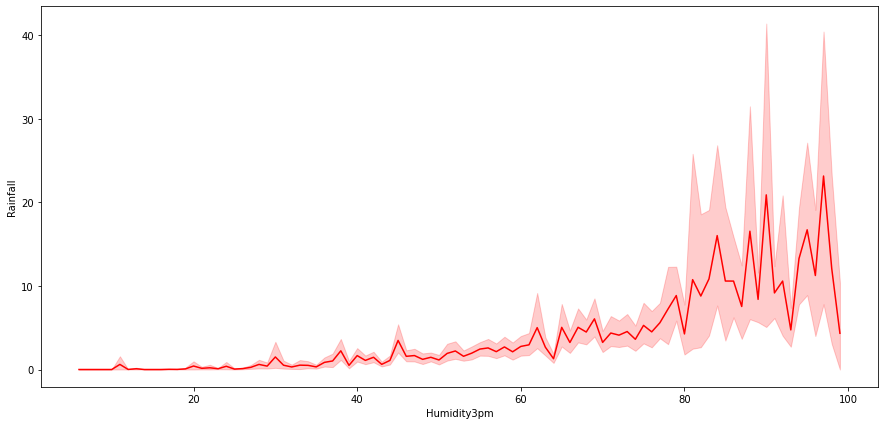

In [345]:
plt.figure(figsize=(15,7))
sns.lineplot(x="Humidity3pm", y='Rainfall', data=rp,color='r')
plt.show()

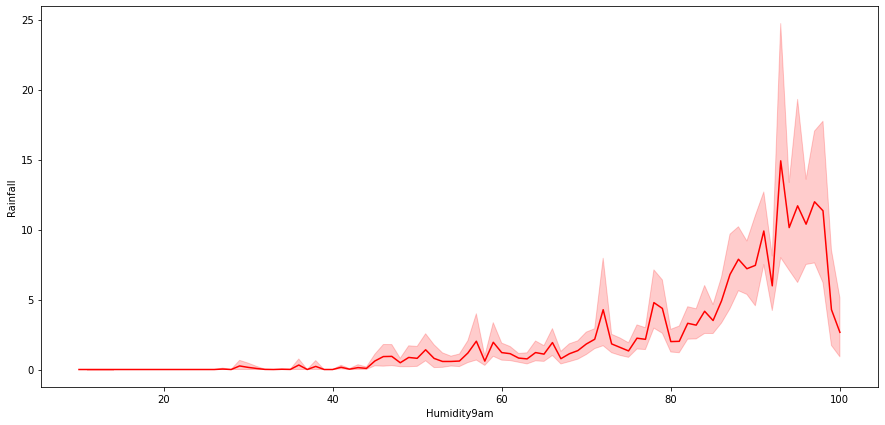

In [346]:
plt.figure(figsize=(15,7))
sns.lineplot(x="Humidity9am", y='Rainfall', data=rp,color='r')
plt.show()

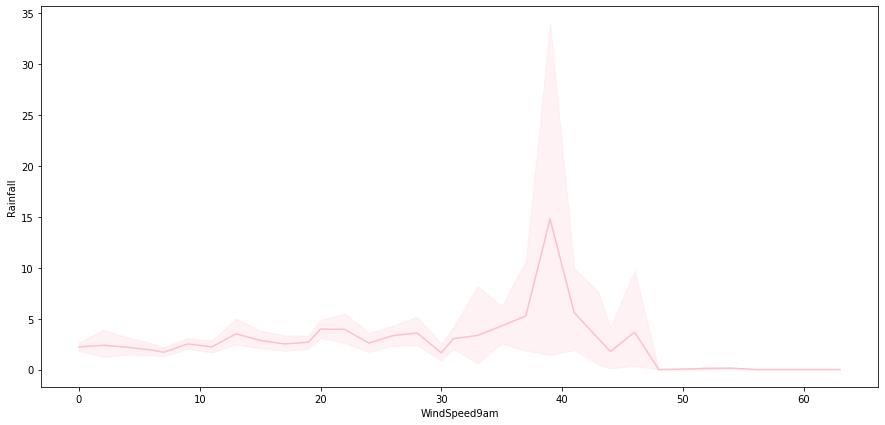

In [347]:
plt.figure(figsize=(15,7))
sns.lineplot(x="WindSpeed9am", y='Rainfall', data=rp,color='pink')
plt.show()

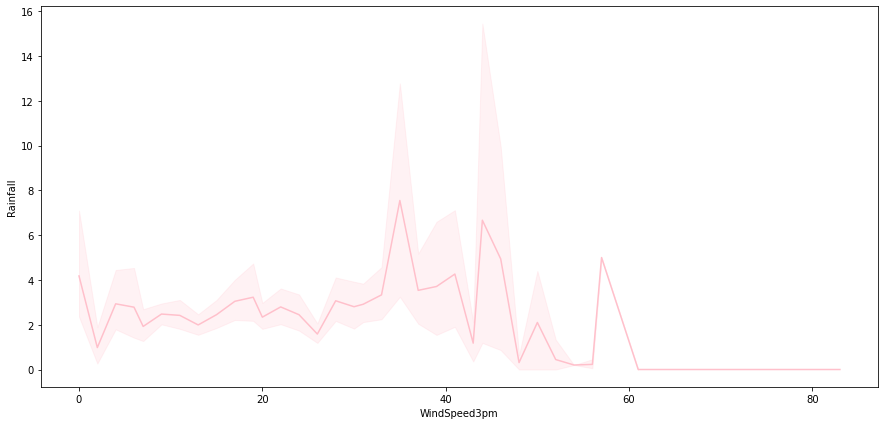

In [348]:
plt.figure(figsize=(15,7))
sns.lineplot(x="WindSpeed3pm", y='Rainfall', data=rp,color='pink')
plt.show()

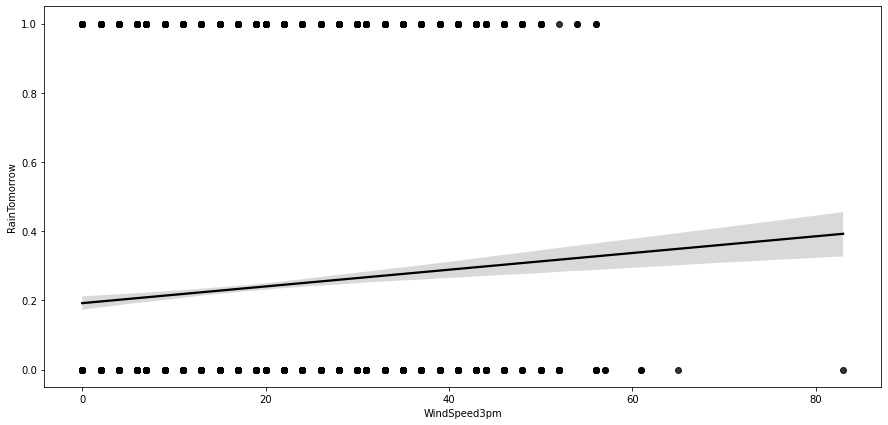

In [349]:
plt.figure(figsize=(15,7))
sns.regplot(x="WindSpeed3pm", y='RainTomorrow', data=rp,color='black')
plt.show()

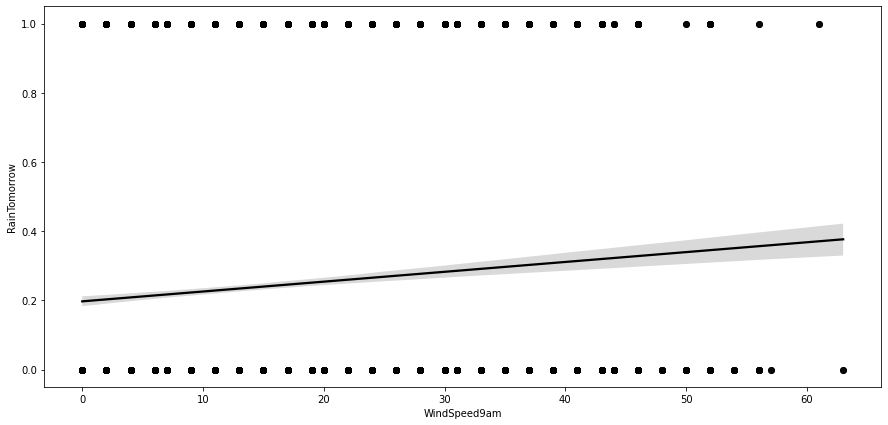

In [350]:
plt.figure(figsize=(15,7))
sns.regplot(x="WindSpeed9am", y='RainTomorrow', data=rp,color='black')
plt.show()

### Observation-8

From the above results we have observed that..

When target is Raintomorrow:

1) Sunshine, temp3pm, pressure9am, maxtemp and evaporation columns has negative correlation with target(Rain tomorrow) column.

2) Humidity3pm, rain today, humidity9am, rainfall, cloud9am, Mintemp and windspeed9am and windspeed 3pm columns are making positive correlation with the target column(Raintomorrow).

3) Month, location and winddir3Pm column is making zero correlation with target column.

When target is Rainfall :

3) Temat3Pm, sunshine, maxtemp and pressure3Pm and pressure9am columns have negative corelation with target columns, means one increases then another decreases.

4) Day,, temp9am, year, and location column has no correlation with target column.

5) Raintoday, Humidity3Pm, Humidity9am, cloude3pm, Mintemp and windgustspeed columns are mmaking  poeistive correlation with the target columns, Which shows that if one column value will increase then another will also increase.

.

## Phase-1(Classification model)

### Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow

### Data preprocessing

In [353]:
rp_cls=rp

In [356]:
y=rp_cls.iloc[:,-4]

In [358]:
rp_cls.drop(['RainTomorrow'],axis=1,inplace=True)

In [361]:
x=rp_cls

In [363]:
x.shape

(8425, 24)

In [364]:
y.shape

(8425,)

In [365]:
col=x.columns

## Removing outliers using zscore method

In [366]:
from scipy.stats import zscore

In [368]:
z=np.abs(zscore(x))
z.shape

(8425, 24)

In [370]:
x=x[(z<3).all(axis=1)]

In [371]:
y=y[(z<3).all(axis=1)]

In [372]:
x.shape

(7986, 24)

In [373]:
y.shape

(7986,)

In [374]:
Data_loss=((8425-7986)/8425)*100
print("Data loss is",Data_loss,'%')

Data loss is 5.210682492581602 %


### We have removed the outliers and lost our 5.2% data which is less than 10% So we can continue with this 

## Removing Skewness

In [376]:
x.skew()

Location        -0.039959
MinTemp         -0.078160
MaxTemp          0.327128
Rainfall         3.518724
Evaporation      1.507495
Sunshine         0.593800
WindGustDir      0.111581
WindGustSpeed    0.536437
WindDir9am       0.159769
WindDir3pm      -0.125856
WindSpeed9am     0.722205
WindSpeed3pm     0.323679
Humidity9am     -0.237692
Humidity3pm      0.117050
Pressure9am      0.232142
Pressure3pm     -0.138552
Cloud9am        -0.845950
Cloud3pm        -0.783146
Temp9am         -0.028800
Temp3pm          0.350851
RainToday        1.299277
Day              0.002232
Month            0.054792
Year             0.430556
dtype: float64

In [377]:
from sklearn.preprocessing import power_transform

In [378]:
x=power_transform(x,method='yeo-johnson')

In [379]:
x=pd.DataFrame(x,columns=col)

In [381]:
x.skew()

Location        -0.184113
MinTemp         -0.102839
MaxTemp         -0.014246
Rainfall         1.041316
Evaporation      0.031839
Sunshine         0.196645
WindGustDir     -0.190483
WindGustSpeed    0.004332
WindDir9am      -0.160192
WindDir3pm      -0.249917
WindSpeed9am    -0.109077
WindSpeed3pm    -0.075143
Humidity9am     -0.065444
Humidity3pm     -0.037402
Pressure9am      0.000000
Pressure3pm      0.001000
Cloud9am        -0.654028
Cloud3pm        -0.582904
Temp9am         -0.055152
Temp3pm         -0.012650
RainToday        1.299277
Day             -0.213400
Month           -0.149369
Year             0.000000
dtype: float64

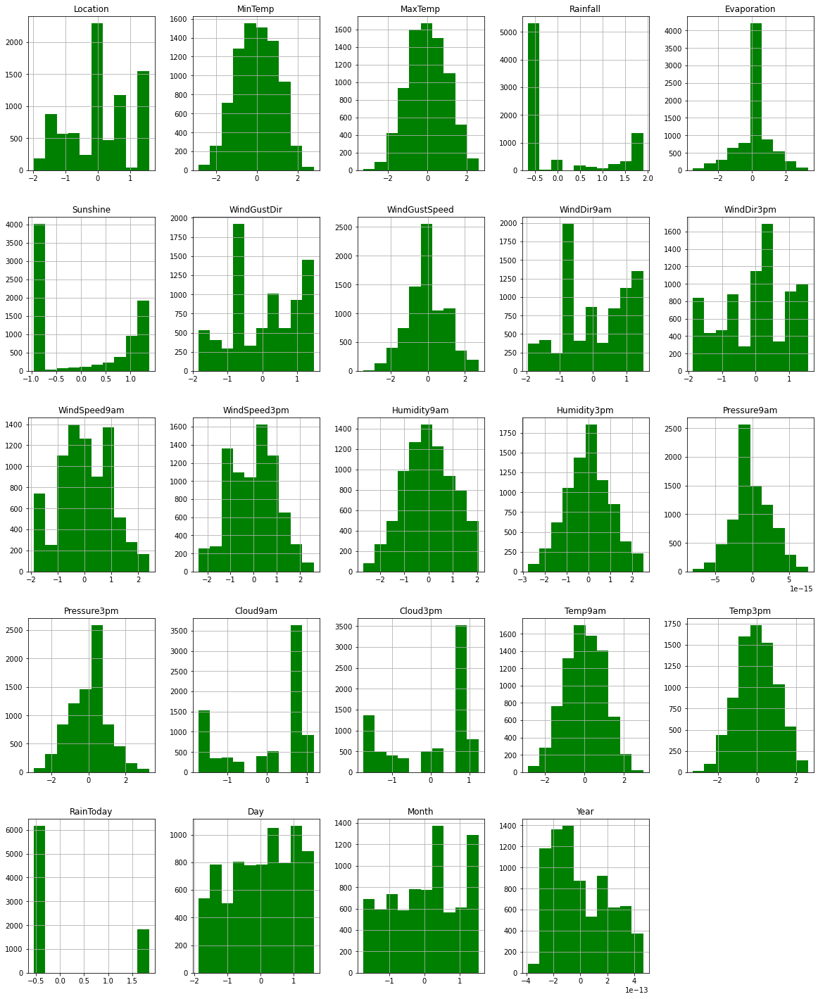

In [386]:
x.hist(figsize=[20,25],color='g')
plt.show()

## Data Scaling with Standard scaler

In [387]:
from sklearn.preprocessing import StandardScaler

In [389]:
ss=StandardScaler()

In [390]:
x=ss.fit_transform(x)

In [392]:
x=pd.DataFrame(x,columns=col)

In [394]:
x.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Day,Month,Year
0,-1.567781,0.064462,-0.064510,0.773027,-0.090354,-0.9523,1.159984,0.449852,1.180778,1.354297,0.789493,0.682998,0.147707,-1.678841,-1.615322,-1.431016,1.174725,0.706043,-0.127256,-0.015198,-0.542906,-1.885415,1.525113,-1.66761
1,-1.567781,-1.053191,0.297019,-0.654076,-0.090354,-0.9523,1.319782,0.449852,-0.145874,1.558571,-0.977515,0.488084,-1.430384,-1.492561,-1.127401,-1.321228,0.656350,0.706043,-0.073534,0.402891,-0.542906,-1.703037,1.525113,-1.66761
2,-1.567781,-0.028144,0.392375,-0.654076,-0.090354,-0.9523,1.475394,0.594848,1.180778,1.558571,0.705758,0.873323,-1.749191,-1.189494,-1.626165,-1.179205,0.656350,-1.315787,0.604396,0.222144,-0.542906,-1.536645,1.525113,-1.66761
3,-1.567781,-0.716266,0.746295,-0.654076,-0.090354,-0.9523,-0.580632,-1.249784,0.469774,-1.874519,-0.056219,-0.943103,-1.375981,-2.063945,0.054452,-0.519718,0.656350,0.706043,0.087446,0.750690,-0.542906,-1.381211,1.525113,-1.66761
4,-1.567781,0.821017,1.364699,1.135524,-0.090354,-0.9523,1.159984,0.225685,-1.524932,-0.140101,-0.534239,0.288055,0.846984,-1.011472,-1.084030,-1.602356,0.656350,1.237701,0.033816,1.227896,-0.542906,-1.233988,1.525113,-1.66761


## VIF
### Variance inflation factor

In [397]:
import statsmodels.api as si
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [401]:
def vif(x):
    vif=pd.DataFrame()
    vif['Variables']=x.columns
    vif['Vif factor']=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    return vif

In [402]:
vif(x)

,Variables,Vif factor
0,Location,1.581620
1,MinTemp,8.791597
2,MaxTemp,25.579014
3,Rainfall,8.491479
4,Evaporation,1.466857
5,Sunshine,2.000261
6,WindGustDir,1.642974
7,WindGustSpeed,2.307625
8,WindDir9am,1.335248
9,WindDir3pm,1.494676


As we can see the vif factor of Temp3pm colum and Maxtemp column are high it means both columns represent the same information, so we are droping Temp3pm column.

In [403]:
x.drop(['Temp3pm'],axis=1,inplace=True)

In [404]:
vif(x)

,Variables,Vif factor
0,Location,1.577740
1,MinTemp,8.727440
2,MaxTemp,9.365746
3,Rainfall,8.491358
4,Evaporation,1.466818
5,Sunshine,1.973403
6,WindGustDir,1.638813
7,WindGustSpeed,2.290591
8,WindDir9am,1.334962
9,WindDir3pm,1.491103


As we can see the vif factor of Temp9am colum and Maxtemp column are high it means both columns represent the same information, so we are droping Temp9am column.

In [405]:
x.drop(['Temp9am'],axis=1,inplace=True)

In [406]:
vif(x)

,Variables,Vif factor
0,Location,1.577552
1,MinTemp,4.720551
2,MaxTemp,5.606488
3,Rainfall,8.485989
4,Evaporation,1.466793
5,Sunshine,1.972769
6,WindGustDir,1.638043
7,WindGustSpeed,2.261121
8,WindDir9am,1.334961
9,WindDir3pm,1.491102


As we can see the vif factor of pressure9am colum and pressure3pm column are high it means both columns represent the same information, so we are droping pressure9am column

In [407]:
x.drop(['Pressure9am'],axis=1,inplace=True)

In [408]:
vif(x)

,Variables,Vif factor
0,Location,1.574534
1,MinTemp,4.510921
2,MaxTemp,5.346632
3,Rainfall,8.455023
4,Evaporation,1.462821
5,Sunshine,1.887800
6,WindGustDir,1.629658
7,WindGustSpeed,2.150067
8,WindDir9am,1.324026
9,WindDir3pm,1.417731


As we can see the vif factor of Rainfall colum and RainToday column are high it means both columns represent the same information, so we are droping Rainfall column.

In [412]:
x.drop(['Rainfall'],axis=1,inplace=True)

In [413]:
vif(x)

,Variables,Vif factor
0,Location,1.574414
1,MinTemp,4.464878
2,MaxTemp,5.312940
3,Evaporation,1.457273
4,Sunshine,1.887762
5,WindGustDir,1.629330
6,WindGustSpeed,2.145096
7,WindDir9am,1.323473
8,WindDir3pm,1.413285
9,WindSpeed9am,2.082960


As we can see the vif factor of MinTemp colum and MaxTemp column are high it means both columns represent the same information, so we are droping MaxTemp column.

In [414]:
x.drop(['MaxTemp'],axis=1,inplace=True)

In [416]:
vif(x)

,Variables,Vif factor
0,Location,1.572723
1,MinTemp,1.774955
2,Evaporation,1.436912
3,Sunshine,1.884722
4,WindGustDir,1.628824
5,WindGustSpeed,2.131140
6,WindDir9am,1.304876
7,WindDir3pm,1.402931
8,WindSpeed9am,1.984421
9,WindSpeed3pm,1.941972


## Adopting SMOTE 

In [417]:
from imblearn.over_sampling import SMOTE

In [418]:
sm=SMOTE()

<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

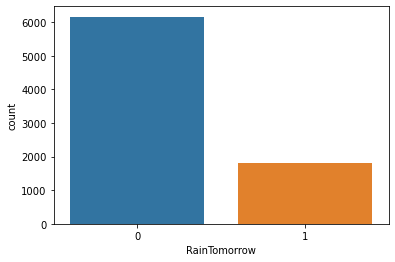

In [419]:
sns.countplot(y)

In [420]:
x,y=sm.fit_resample(x,y)

<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

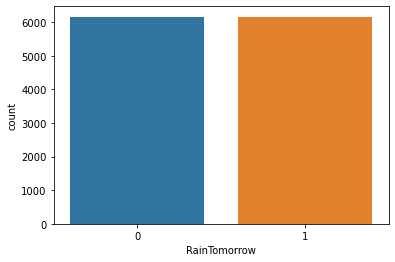

In [421]:
sns.countplot(y)

In [422]:
x.shape

(12328, 19)

In [423]:
y.shape

(12328,)

# Model learning phase-  Phase-1

So basically it will become important to know which type of machine learning model we are going to construct.It depends on the target. Here we are going to use classification model because our target column is catagorical in nature.

For classification model, Some matrix we are going to find like:
    
    * Confusion matrix
    * Accuracu Score
    * Classification report
    

### Models

* Decision Tree classifier
* KNeighbors classifier
* Support vectod machine classifier
* Random Forest classifier

### For bagging and boosting :

* AdaBoost classifier
* Gradient Boosting classifier
* XGboost classifier
* Naive bayes classifier

In [430]:
import sklearn
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
from sklearn.model_selection import GridSearchCV,train_test_split,cross_val_score
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xg 

## Creating a function for finding Best random state

In [447]:
def model_select(model):
    max_score=0
    max_state=0
    
    for i in range(0,100):
        x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.22,random_state=i)
        md=model()
        md.fit(x_train,y_train)
        pred=md.predict(x_test)
        ac_score=accuracy_score(y_test,pred)
        
        if ac_score > max_score:
            max_score=ac_score
            max_state=i
    print("Max score is {} at random state {}".format(max_score,max_state))    

## Logistic Regression
Finding best random state by calling model_select function

In [462]:
model_select(LogisticRegression)

Max score is 0.7910062661260597 at random state 53


In [463]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.22, random_state=53)

In [464]:
lr=LogisticRegression()
lr.fit(x_train,y_train)
pred=lr.predict(x_test)
print("Accuracy ",accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy  0.7910062661260597
[[1090  271]
 [ 296 1056]]
              precision    recall  f1-score   support

           0       0.79      0.80      0.79      1361
           1       0.80      0.78      0.79      1352

    accuracy                           0.79      2713
   macro avg       0.79      0.79      0.79      2713
weighted avg       0.79      0.79      0.79      2713



In [466]:
for i in range(12,20):
    cvs=cross_val_score(lr,x,y,cv=i)
    print("cross validation when cv =",i,'---',cvs.mean())

cross validation when cv = 12 --- 0.7285950383737657
cross validation when cv = 13 --- 0.735328258550571
cross validation when cv = 14 --- 0.7363916446776833
cross validation when cv = 15 --- 0.737116526539253
cross validation when cv = 16 --- 0.7356652264726194
cross validation when cv = 17 --- 0.7367822797400523
cross validation when cv = 18 --- 0.7387379471929351
cross validation when cv = 19 --- 0.7435315590236791


In [467]:
cvlr=19
Modellr=79.10
Cslr= 74.35
Diffrencelr= 79.10-74.35

### Kneighbors classifier
Finding best random state by calling model_select function

In [468]:
model_select(KNeighborsClassifier)

Max score is 0.8813122005160339 at random state 38


In [469]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.22, random_state=38)

In [470]:
knn=KNeighborsClassifier()
knn.fit(x_train,y_train)
pred=knn.predict(x_test)
print('Accuracy:',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy: 0.8813122005160339
[[1070  266]
 [  56 1321]]
              precision    recall  f1-score   support

           0       0.95      0.80      0.87      1336
           1       0.83      0.96      0.89      1377

    accuracy                           0.88      2713
   macro avg       0.89      0.88      0.88      2713
weighted avg       0.89      0.88      0.88      2713



In [471]:
for i in range(12,20):
    cvs=cross_val_score(knn,x,y,cv=i)
    print("cross validation when cv =",i,'---',cvs.mean())

cross validation when cv = 12 --- 0.8025913815944845
cross validation when cv = 13 --- 0.8127997526564974
cross validation when cv = 14 --- 0.806221991685953
cross validation when cv = 15 --- 0.8114077643528108
cross validation when cv = 16 --- 0.8122354380379673
cross validation when cv = 17 --- 0.8125451080973854
cross validation when cv = 18 --- 0.8106793917749225
cross validation when cv = 19 --- 0.8231741290394279


In [472]:
cvknn=19
Modelknn=88.13
Csknn= 82.31
Diffrenceknn= 88.13-82.31

### Naive bayes classifier
Finding best random state by calling model_select function

In [475]:
model_select(GaussianNB)

Max score is 0.7629929966826391 at random state 51


In [476]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.22, random_state=51)

In [477]:
mn=GaussianNB()
mn.fit(x_train,y_train)
pred=mn.predict(x_test)
print('Accuracy:',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy: 0.7629929966826391
[[ 988  339]
 [ 304 1082]]
              precision    recall  f1-score   support

           0       0.76      0.74      0.75      1327
           1       0.76      0.78      0.77      1386

    accuracy                           0.76      2713
   macro avg       0.76      0.76      0.76      2713
weighted avg       0.76      0.76      0.76      2713



In [478]:
for i in range(13,20):
    cvr=cross_val_score(mn,x,y,cv=i)
    print("Cross validation when cv=",i,"---",cvr.mean())

Cross validation when cv= 13 --- 0.7196648516058688
Cross validation when cv= 14 --- 0.7201779633533324
Cross validation when cv= 15 --- 0.7195979820071856
Cross validation when cv= 16 --- 0.7202606245894184
Cross validation when cv= 17 --- 0.7211184684760197
Cross validation when cv= 18 --- 0.7223575124618793
Cross validation when cv= 19 --- 0.7247980348634526


In [479]:
cvgn=19
Modelgnr=76.29
Csgn= 72.47
Diffrencegn= 76.29-72.47

### Decision tree classifier
Finding best random state by calling model_select function

In [481]:
model_select(DecisionTreeClassifier)

Max score is 0.891632878732031 at random state 88


In [482]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.22, random_state=88)

In [483]:
dtc=DecisionTreeClassifier()
dtc.fit(x_train,y_train)
pred=dtc.predict(x_test)
print('Accuracy:',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy: 0.8809436048654626
[[1187  176]
 [ 147 1203]]
              precision    recall  f1-score   support

           0       0.89      0.87      0.88      1363
           1       0.87      0.89      0.88      1350

    accuracy                           0.88      2713
   macro avg       0.88      0.88      0.88      2713
weighted avg       0.88      0.88      0.88      2713



In [484]:
for i in range(12,20):
    cvr=cross_val_score(dtc,x,y,cv=i)
    print("Cross validation when cv=",i,"---",cvr.mean())

Cross validation when cv= 12 --- 0.8272745628093361
Cross validation when cv= 13 --- 0.8403996553881176
Cross validation when cv= 14 --- 0.8390785080413344
Cross validation when cv= 15 --- 0.841416269795405
Cross validation when cv= 16 --- 0.8352024272744117
Cross validation when cv= 17 --- 0.8312281584049979
Cross validation when cv= 18 --- 0.8270610122223645
Cross validation when cv= 19 --- 0.8461252929733454


In [485]:
cvdtc=19
Modeldtc=88.09
Csdtc= 84.61
Diffrencedtc= 88.09-84.61

### Support vector classifier
Finding best random state by calling model_select function

In [486]:
model_select(SVC)

Max score is 0.8724659049023221 at random state 84


In [488]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.22, random_state=84)

In [489]:
sv=SVC()
sv.fit(x_train,y_train)
pred=sv.predict(x_test)
print('Accuracy:',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy: 0.8724659049023221
[[1155  207]
 [ 139 1212]]
              precision    recall  f1-score   support

           0       0.89      0.85      0.87      1362
           1       0.85      0.90      0.88      1351

    accuracy                           0.87      2713
   macro avg       0.87      0.87      0.87      2713
weighted avg       0.87      0.87      0.87      2713



In [491]:
for i in range(15,20):
    cvr=cross_val_score(sv,x,y,cv=i)
    print("Cross validation when cv=",i,"---",cvr.mean())

Cross validation when cv= 15 --- 0.8057325300086042
Cross validation when cv= 16 --- 0.806071765458925
Cross validation when cv= 17 --- 0.8020064931073597
Cross validation when cv= 18 --- 0.7996492650929838
Cross validation when cv= 19 --- 0.814579284769591


In [492]:
cvsv=19
Modelsv=87.24
Csdsv= 81.45
Diffrencesv= 87.24-81.45

## Ensamble technique --

### Bagging and boosting

## Random forest classifier
Finding best random state by calling model_select function

In [493]:
model_select(RandomForestClassifier)

Max score is 0.9495023958717287 at random state 71


In [494]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.22, random_state=71)

In [495]:
rfc=RandomForestClassifier()
rfc.fit(x_train,y_train)
pred=rfc.predict(x_test)
print('Accuracy:',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy: 0.9391817176557317
[[1280   95]
 [  70 1268]]
              precision    recall  f1-score   support

           0       0.95      0.93      0.94      1375
           1       0.93      0.95      0.94      1338

    accuracy                           0.94      2713
   macro avg       0.94      0.94      0.94      2713
weighted avg       0.94      0.94      0.94      2713



In [496]:
for i in range(12,20):
    cvr=cross_val_score(rfc,x,y,cv=i)
    print("Cross validation when cv=",i,"---",cvr.mean())

Cross validation when cv= 12 --- 0.8769956473528605
Cross validation when cv= 13 --- 0.8915000124834594
Cross validation when cv= 14 --- 0.8973253902737444
Cross validation when cv= 15 --- 0.8999062524387701
Cross validation when cv= 16 --- 0.8921444152475281
Cross validation when cv= 17 --- 0.8919733570259109
Cross validation when cv= 18 --- 0.8935800571989585
Cross validation when cv= 19 --- 0.9063998344031051


In [497]:
cvrf=15
Modelrf= 93.91
Csrf= 90.63
Diffrencerf =93.91-90.63

### AdaBoostClassifier
Finding best random state by calling model_select function

In [499]:
model_select(AdaBoostClassifier)

Max score is 0.8389237007003317 at random state 0


In [500]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.22, random_state=0)

In [501]:
ada=AdaBoostClassifier()
ada.fit(x_train,y_train)
pred=ada.predict(x_test)
print('Accuracy:',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy: 0.8389237007003317
[[1129  220]
 [ 217 1147]]
              precision    recall  f1-score   support

           0       0.84      0.84      0.84      1349
           1       0.84      0.84      0.84      1364

    accuracy                           0.84      2713
   macro avg       0.84      0.84      0.84      2713
weighted avg       0.84      0.84      0.84      2713



In [502]:
for i in range(14,20):
    cvr=cross_val_score(ada,x,y,cv=i)
    print("Cross validation when cv=",i,"---",cvr.mean())

Cross validation when cv= 14 --- 0.7591082300219645
Cross validation when cv= 15 --- 0.7642054227382783
Cross validation when cv= 16 --- 0.757083796553641
Cross validation when cv= 17 --- 0.7479135444431406
Cross validation when cv= 18 --- 0.7466079025625703
Cross validation when cv= 19 --- 0.7647811998466176


In [503]:
cvada=19
Modelada = 83.89
Csada= 76.47
Diffrenceada=83.89-76.47

### GradientBoostingClassifier
Finding best random state by calling model_select function

In [504]:
model_select(GradientBoostingClassifier)

Max score is 0.8706229266494655 at random state 28


In [506]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.22, random_state=28)

In [507]:
gbc=GradientBoostingClassifier()
gbc.fit(x_train,y_train)
pred=gbc.predict(x_test)
print('Accuracy:',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy: 0.8706229266494655
[[1180  155]
 [ 196 1182]]
              precision    recall  f1-score   support

           0       0.86      0.88      0.87      1335
           1       0.88      0.86      0.87      1378

    accuracy                           0.87      2713
   macro avg       0.87      0.87      0.87      2713
weighted avg       0.87      0.87      0.87      2713



In [508]:
for i in range(12,20):
    cvr=cross_val_score(gbc,x,y,cv=i)
    print("Cross validation when cv=",i,"---",cvr.mean())

Cross validation when cv= 12 --- 0.7708090221604236
Cross validation when cv= 13 --- 0.7877514348283045
Cross validation when cv= 14 --- 0.7941546464318884
Cross validation when cv= 15 --- 0.7963316944797605
Cross validation when cv= 16 --- 0.7902705838260313
Cross validation when cv= 17 --- 0.7861187199302634
Cross validation when cv= 18 --- 0.7917887954544377
Cross validation when cv= 19 --- 0.8081005815915124


In [509]:
cvgbc=19
Modelgbc = 87.06
Csgbc= 80.81
Diffrencegbc =87.06-80.81

## Xg boost Classifier
Finding best random state by calling model_select function

In [510]:
model_select(xg.XGBClassifier)

Max score is 0.9458164393660154 at random state 72


In [513]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.22, random_state=72)

In [514]:
xb=xg.XGBClassifier()
xb.fit(x_train,y_train)
pred=xb.predict(x_test)
print('Accuracy:',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy: 0.9458164393660154
[[1280   64]
 [  83 1286]]
              precision    recall  f1-score   support

           0       0.94      0.95      0.95      1344
           1       0.95      0.94      0.95      1369

    accuracy                           0.95      2713
   macro avg       0.95      0.95      0.95      2713
weighted avg       0.95      0.95      0.95      2713



In [515]:
for i in range(12,20):
    cvr=cross_val_score(xb,x,y,cv=i)
    print("Cross validation when cv=",i,'---',cvr.mean())

Cross validation when cv= 12 --- 0.819110665722004
Cross validation when cv= 13 --- 0.824610131302052
Cross validation when cv= 14 --- 0.830094564912953
Cross validation when cv= 15 --- 0.8436957481677737
Cross validation when cv= 16 --- 0.8240336592719861
Cross validation when cv= 17 --- 0.8294507680530177
Cross validation when cv= 18 --- 0.8359926580441371
Cross validation when cv= 19 --- 0.8460557102394748


In [516]:
cvxg=15
Modelxg=94.58
Csxg=84.36
Diffrencexg=94.58-84.36

## Comparison of all the models

In [524]:
kk={'CV':[cvlr,cvknn,cvgn,cvdtc,cvsv,cvrf,cvada,cvgbc,cvxg],
                 'Model_accuracy':[Modellr,Modelknn,Modelgnr,Modeldtc,Modelsv,Modelrf,Modelada,Modelgbc,Modelxg],
                 'Cross validation Score':[Cslr,Csknn,Csgn,Csdtc,cvsv,Csrf,Csada,Csgbc,Csxg],
 'Diffrence':[Diffrencelr,Diffrenceknn,Diffrencegn,Diffrencedtc,Diffrencesv,Diffrencerf,Diffrenceada,Diffrencegbc,Diffrencexg]
 }

In [525]:
result=pd.DataFrame(kk,index=['Logistic','kneighbour','GaussianNB','Decision tree',
                              'Support vector machine','Random forest','Adaboost','GredientBoosting','XGBoost'])

In [526]:
result

,CV,Model_accuracy,Cross validation Score,Diffrence
Logistic,19,79.10,74.35,4.75
kneighbour,19,88.13,82.31,5.82
GaussianNB,19,76.29,72.47,3.82
Decision tree,19,88.09,84.61,3.48
Support vector machine,19,87.24,19.00,5.79
Random forest,15,93.91,90.63,3.28
Adaboost,19,83.89,76.47,7.42
GredientBoosting,19,87.06,80.81,6.25
XGBoost,15,94.58,84.36,10.22


In [527]:
aa=list(result['Cross validation Score'])

In [529]:
bb=list(result.index)

In [532]:
model_all=pd.DataFrame({'Model':bb,'Accuracy':aa})

In [533]:
model_all

,Model,Accuracy
0,Logistic,74.35
1,kneighbour,82.31
2,GaussianNB,72.47
3,Decision tree,84.61
4,Support vector machine,19.00
5,Random forest,90.63
6,Adaboost,76.47
7,GredientBoosting,80.81
8,XGBoost,84.36


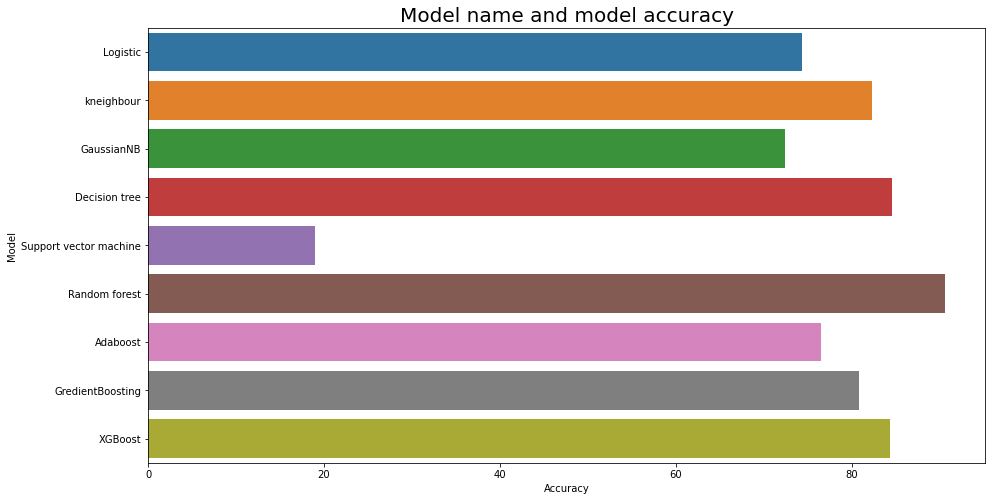

In [535]:
plt.figure(figsize=[15,8])
sns.barplot(data=model_all,y='Model',x='Accuracy')
plt.title("Model name and model accuracy",fontsize=20)
plt.show()

## Best Model
### We are chosing Random forest classifier as a best model, Because this model has least diffrence between model acuracy score and cross validation score and also its accuracy is highest as compare to others.That is why we are choosing RFC
### Model accuracy is : 93.91
### Cross_validation score : 90.63
### Diffrence : 3.28
.

.

## Hyper Parameter tuning
### Grid search cv

In [541]:
parameter=[{'n_estimators':[20,30,40,50],
           'criterion':['gini','entropy'],
           'max_depth':[5,15,20,25,30],
           'max_features':['sqrt','log']}]

In [542]:
GSC=GridSearchCV(rfc,parameter,cv=19)
GSC.fit(x_train,y_train)
GSC.best_params_

{'criterion': 'entropy',
 'max_depth': 25,
 'max_features': 'sqrt',
 'n_estimators': 50}

In [544]:
GSC.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=25, n_estimators=50)

In [547]:
GSC_pred=GSC.best_estimator_.predict(x_test)
accuracy_score(y_test,GSC_pred)

0.9410246959085883

In [568]:
tune_rfc=RandomForestClassifier(criterion='entropy', max_depth=25, n_estimators=50)
tune_rfc.fit(x_train,y_train)
pred=tune_rfc.predict(x_test)
print('Accuracy ',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy  0.9399189089568744
[[1253   91]
 [  72 1297]]
              precision    recall  f1-score   support

           0       0.95      0.93      0.94      1344
           1       0.93      0.95      0.94      1369

    accuracy                           0.94      2713
   macro avg       0.94      0.94      0.94      2713
weighted avg       0.94      0.94      0.94      2713



## We have done with Grid search CV and we got our best model Random forest classifier with 93.99% accuracy.

# Accuracy-94%

## Auc-Roc Curve

In [569]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

In [572]:
y_pred_prob=GSC.best_estimator_.predict_proba(x_test)[:,-1]

In [573]:
y_pred_prob

array([0.94      , 0.11864469, 0.96      , ..., 0.92      , 0.08      ,
       0.98      ])

In [575]:
fpr,tpr,threshold=roc_curve(y_test,y_pred_prob)

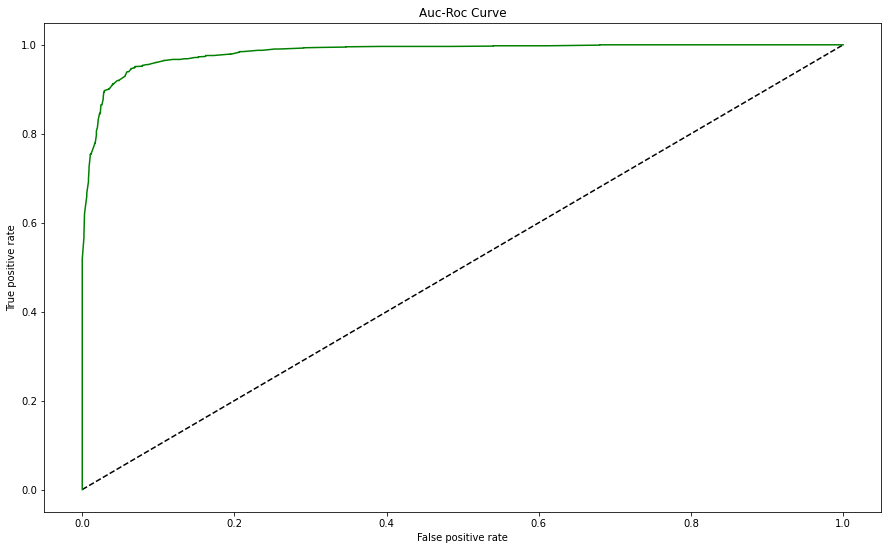

In [577]:
plt.figure(figsize=[15,9])
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr,label='RandomForestClassifier',color='g')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('Auc-Roc Curve')
plt.show()

In [578]:
Auc_Roc=roc_auc_score(y_test,GSC.best_estimator_.predict(x_test))

In [579]:
print(Auc_Roc)

0.9409721316393613


### AUC-ROC curve score is 94.09 %

### Feature Importance

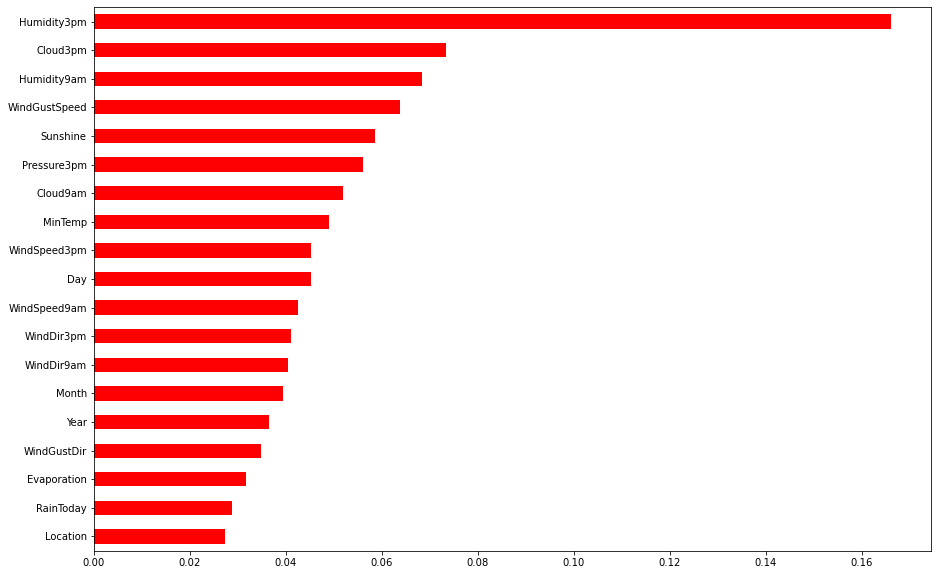

In [585]:
plt.figure(figsize=(15,10))
impo_features = pd.Series(tune_rfc.feature_importances_, index=x.columns)
impo_features.nlargest((25)).sort_values().plot(kind='barh', align='center',color='r')
plt.show()

## Prediction

In [586]:
predict=tune_rfc.predict(x_test)[:]

In [587]:
original=y_test[:]

In [590]:
result=pd.DataFrame([predict,original],index=['Predict','Original'])

In [591]:
result

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

## Saving the model

In [592]:
import joblib

In [593]:
joblib.dump(tune_rfc,'Rainfall PredictionC')

['Rainfall PredictionC']

## Conclusion(Phase-1)

From the above observations we are concluding that

1. We had null values in data set, So we adopted imputation technique.

2. In order to replace the object data to the int values we used encoading technique.

3. Some columns we dropped, because they was not more contributing to make prediction.

4. We changed the date column in the date time format in order to separate the day, month and year.

We used many classifier for building our best model -

like-


A. Linear regression

B. k nearest neighbour classifier

c. Design tree classifier

D. Support vector machine classifier

5. In order to control overfitting and underfitting we adopted Cross validation.

6. For Bagging and boosting we have used Random forest classifier,Adaboost classifier and Gradient boosting classifier and xgboost classifier.

7. we worked on Hyper parameter tuning on random forest classifier for boosting our model accuracy.

Finally we got our best model Which is Random forest classifier with 94 % accuracy.

We have ploted Auc-Roc curve and got 94.09 %. Auc-Roc curve score.

We maked the barplot for presenting the feature importance of columns

### Now our model is ready to predict with 94% accuracy

.

.

.

# Phase-2(Rainfall  prediction)

### b) Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import numpy as np

In [2]:
rp_new=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv")

In [3]:
rp_new.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
rp_new.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


## Adopting imputation technique

In [5]:
from sklearn.impute import SimpleImputer

In [6]:
si=SimpleImputer(strategy='most_frequent')

In [7]:
null_col=['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow']

In [8]:
for i in null_col:
    rp_new[i]=si.fit_transform(rp_new[i].values.reshape(-1,1))

In [9]:
rp_new.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,4.0,0.0,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,4.0,0.0,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,4.0,0.0,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,4.0,0.0,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,4.0,0.0,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [10]:
for i in rp_new['Rainfall']:
    if i < 1:
        rp_new['Rainfall']=rp_new['Rainfall'].replace({i:'less than 1 mm'})
    if i >= 1 and i <2:
        rp_new['Rainfall']=rp_new['Rainfall'].replace({i:'1-2 mm'})
    if i >=2 and i < 5:
        rp_new['Rainfall']=rp_new['Rainfall'].replace({i:'2-5 mm'})
    if i >= 5 and i <10:
        rp_new['Rainfall']=rp_new['Rainfall'].replace({i:'5-10 mm'})
    if i >=10 and i < 50:
        rp_new['Rainfall']=rp_new['Rainfall'].replace({i:'10-50 mm'})
    if i >= 50 and i < 100 :
        rp_new['Rainfall']=rp_new['Rainfall'].replace({i:'50-100 mm'})
    if i >= 100 and i < 150:
        rp_new['Rainfall']=rp_new['Rainfall'].replace({i:'100-150 mm'})
    if i >= 150 and i < 200:
        rp_new['Rainfall']=rp_new['Rainfall'].replace({i:'150-200 mm'})
    if i >= 200 and i < 250 :
        rp_new['Rainfall']=rp_new['Rainfall'].replace({i:'200-250 mm'})
    if i >= 250 and i < 300:
        rp_new['Rainfall']=rp_new['Rainfall'].replace({i:'250-300 mm'})
    if i >= 300 and i <350:
        rp_new['Rainfall']=rp_new['Rainfall'].replace({i:'300-350 mm'})
    else :
        rp_new['Rainfall']=rp_new['Rainfall'].replace({i:'350-400 mm'})

In [11]:
rp_new['Rainfall'].value_counts()

less than 1 mm    6358
10-50 mm           613
2-5 mm             586
5-10 mm            439
1-2 mm             374
50-100 mm           44
100-150 mm           6
200-250 mm           3
350-400 mm           1
150-200 mm           1
Name: Rainfall, dtype: int64

In [12]:
rp_new

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,less than 1 mm,4.0,0.0,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,7.0,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,less than 1 mm,4.0,0.0,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,7.0,7.0,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,less than 1 mm,4.0,0.0,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,7.0,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,less than 1 mm,4.0,0.0,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,7.0,7.0,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1-2 mm,4.0,0.0,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,less than 1 mm,4.0,0.0,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,7.0,7.0,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,less than 1 mm,4.0,0.0,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,7.0,7.0,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,less than 1 mm,4.0,0.0,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,7.0,7.0,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,less than 1 mm,4.0,0.0,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


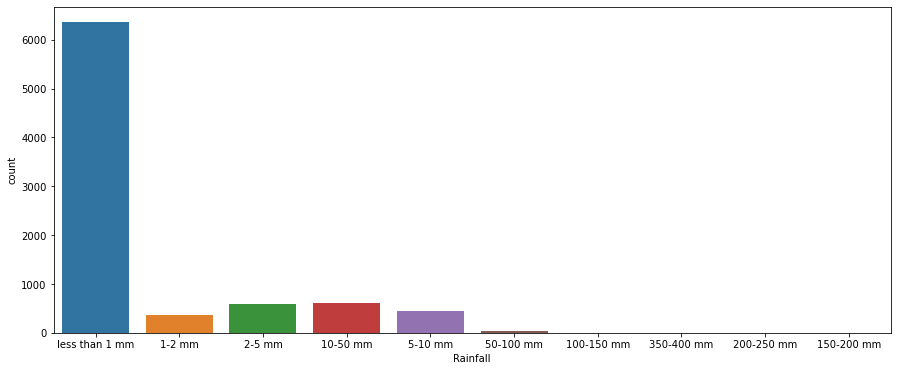

In [13]:
plt.figure(figsize=[15,6])
sns.countplot(rp_new['Rainfall'])
plt.show()

## Encoding technique 

In [14]:
from sklearn.preprocessing import LabelEncoder

In [15]:
le=LabelEncoder()

In [16]:
ccol=['Location','WindGustDir','WindDir9am','WindDir3pm','RainToday','RainTomorrow','Rainfall']

In [17]:
for i in ccol:
    rp_new[i]=le.fit_transform(rp_new[i])

### Changing Date column into date time format

In [18]:
rp_new['Day']=pd.to_datetime(rp_new['Date'],format='%Y/%m/%d').dt.day

In [19]:
rp_new['Month']=pd.to_datetime(rp_new['Date'],format='%Y/%m/%d').dt.month
rp_new['Year']=pd.to_datetime(rp_new['Date'],format='%Y/%m/%d').dt.year

In [20]:
rp_new.drop(['Date'],axis=1,inplace=True)

In [21]:
rp_new.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,22.9,9,4.0,0.0,13,44.0,13,14,...,1007.1,8.0,7.0,16.9,21.8,0,0,1,12,2008
1,1,7.4,25.1,9,4.0,0.0,14,44.0,6,15,...,1007.8,7.0,7.0,17.2,24.3,0,0,2,12,2008
2,1,12.9,25.7,9,4.0,0.0,15,46.0,13,15,...,1008.7,7.0,2.0,21.0,23.2,0,0,3,12,2008
3,1,9.2,28.0,9,4.0,0.0,4,24.0,9,0,...,1012.8,7.0,7.0,18.1,26.5,0,0,4,12,2008
4,1,17.5,32.3,0,4.0,0.0,13,41.0,1,7,...,1006.0,7.0,8.0,17.8,29.7,0,0,5,12,2008


In [22]:
rp_new.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Day', 'Month', 'Year'],
      dtype='object')

## Spliting the data

In [23]:
y=rp_new.iloc[:,3]

In [24]:
rp_new.drop(['Rainfall'],axis=1,inplace=True)

In [25]:
x=rp_new

In [26]:
x.shape

(8425, 24)

In [27]:
y.shape

(8425,)

## Removing Outliers

In [28]:
from scipy.stats import zscore

In [29]:
z=np.abs(zscore(x))
z.shape

(8425, 24)

In [30]:
x=x[(z<3).all(axis=1)]

In [31]:
y=y[(z<3).all(axis=1)]

In [32]:
x.shape

(8094, 24)

In [33]:
y.shape

(8094,)

In [34]:
colm=x.columns

In [35]:
data_loss=((8425-8094)/8425)*100
print('Data loss is ',data_loss)

Data loss is  3.9287833827893173


### As we can see our data loss is 3.92% which is les than 10%, So we can continue with this 

## Removing skewness

In [36]:
x.skew()

Location        -0.035476
MinTemp         -0.088073
MaxTemp          0.334238
Evaporation      1.509904
Sunshine         0.607520
WindGustDir      0.110706
WindGustSpeed    0.538757
WindDir9am       0.151932
WindDir3pm      -0.129182
WindSpeed9am     0.722972
WindSpeed3pm     0.324278
Humidity9am     -0.243259
Humidity3pm      0.117924
Pressure9am      0.236304
Pressure3pm     -0.136594
Cloud9am        -0.859068
Cloud3pm        -0.793661
Temp9am         -0.029620
Temp3pm          0.357928
RainToday        1.230980
RainTomorrow     1.255180
Day              0.005476
Month            0.059364
Year             0.431305
dtype: float64

In [37]:
from sklearn.preprocessing import power_transform

In [38]:
x=power_transform(x,method='yeo-johnson')

In [39]:
x=pd.DataFrame(x,columns=colm)

In [40]:
x.skew()

Location        -0.182654
MinTemp         -0.104228
MaxTemp         -0.013476
Evaporation      0.032877
Sunshine         0.204222
WindGustDir     -0.190579
WindGustSpeed    0.004619
WindDir9am      -0.162635
WindDir3pm      -0.250849
WindSpeed9am    -0.108626
WindSpeed3pm    -0.075269
Humidity9am     -0.067968
Humidity3pm     -0.038177
Pressure9am      0.000000
Pressure3pm      0.000936
Cloud9am        -0.659618
Cloud3pm        -0.587294
Temp9am         -0.053804
Temp3pm         -0.011984
RainToday        1.230980
RainTomorrow     1.255180
Day             -0.212130
Month           -0.148680
Year             0.000000
dtype: float64

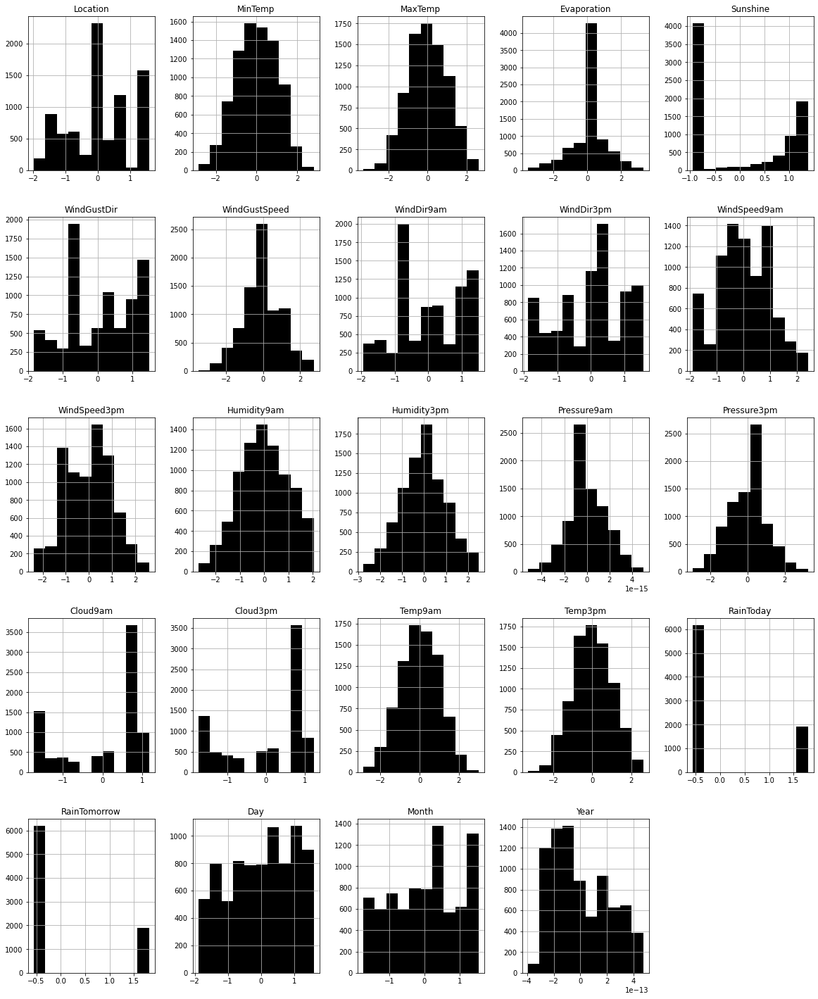

In [41]:
x.hist(figsize=[20,25],color='black')
plt.show()

## Data scaling with Min Max Scaler

In [42]:
from sklearn.preprocessing import MinMaxScaler

In [43]:
mm=MinMaxScaler()

In [44]:
x=mm.fit_transform(x)

In [45]:
x=pd.DataFrame(x,columns=colm)

In [46]:
x.head()

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,0.115788,0.514565,0.548553,0.501867,0.0,0.904694,0.632975,0.905891,0.940348,0.623327,...,0.246991,1.000000,0.820648,0.468435,0.557866,0.0,0.0,0.000000,1.0,0.0
1,0.115788,0.317007,0.609958,0.501867,0.0,0.952978,0.632975,0.520562,1.000000,0.212574,...,0.264652,0.819912,0.820648,0.477606,0.628754,0.0,0.0,0.052637,1.0,0.0
2,0.115788,0.498163,0.626145,0.501867,0.0,1.000000,0.656303,0.905891,1.000000,0.603856,...,0.287497,0.819912,0.143486,0.593369,0.598116,0.0,0.0,0.100611,1.0,0.0
3,0.115788,0.376464,0.686195,0.501867,0.0,0.379119,0.359432,0.699182,0.000000,0.426695,...,0.393553,0.819912,0.820648,0.505089,0.687672,0.0,0.0,0.145390,1.0,0.0
4,0.115788,0.648728,0.791008,0.501867,0.0,0.904694,0.596907,0.122185,0.504369,0.315583,...,0.219426,0.819912,1.000000,0.495932,0.768437,0.0,0.0,0.187777,1.0,0.0


## VIF (Variance inflation factor)

In [47]:
import statsmodels.api
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [48]:
def vif(x):
    vif=pd.DataFrame()
    vif['Variables']=x.columns
    vif['Vif Facator']=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    return vif

In [49]:
vif(x)

,Variables,Vif Facator
0,Location,7.807252
1,MinTemp,77.295222
2,MaxTemp,300.923010
3,Evaporation,18.229803
4,Sunshine,3.696734
5,WindGustDir,7.087880
6,WindGustSpeed,27.075356
7,WindDir9am,6.241872
8,WindDir3pm,6.556077
9,WindSpeed9am,10.273387


As we can see the vif factor of Maxtemp column and Temp3pm column are high it means both columns represent the same information, so we are droping Temp3pm column.

In [50]:
x.drop(['Temp3pm'],axis=1,inplace=True)

In [51]:
vif(x)

,Variables,Vif Facator
0,Location,7.801629
1,MinTemp,77.270648
2,MaxTemp,96.653073
3,Evaporation,18.098432
4,Sunshine,3.680861
5,WindGustDir,7.086991
6,WindGustSpeed,27.000876
7,WindDir9am,6.228685
8,WindDir3pm,6.555884
9,WindSpeed9am,10.272692


As we can see the vif factor of Temp9am column and Maxtemp column are high it means both columns represent the same information, so we are droping Temp9am column.

In [52]:
x.drop(['Temp9am'],axis=1,inplace=True)

In [53]:
vif(x)

,Variables,Vif Facator
0,Location,7.801385
1,MinTemp,41.221507
2,MaxTemp,49.793521
3,Evaporation,18.097503
4,Sunshine,3.680288
5,WindGustDir,7.082209
6,WindGustSpeed,26.732139
7,WindDir9am,6.228392
8,WindDir3pm,6.555651
9,WindSpeed9am,10.174756


As we can see the vif factor of pressure9am column and pressure3pm column are high it means both columns represent the same information, so we are droping pressure9am column

In [54]:
x.drop(['Pressure9am'],axis=1,inplace=True)

In [55]:
vif(x)

,Variables,Vif Facator
0,Location,7.784853
1,MinTemp,38.627700
2,MaxTemp,44.441596
3,Evaporation,18.092932
4,Sunshine,3.491346
5,WindGustDir,7.032832
6,WindGustSpeed,25.732833
7,WindDir9am,6.195864
8,WindDir3pm,6.269865
9,WindSpeed9am,9.392701


As we can see the vif factor of MinTemp column and Maxtemp column are high it means both columns represent the same information, so we are droping MaxTemp column.

In [56]:
x.drop(['MaxTemp'],axis=1,inplace=True)

In [57]:
vif(x)

,Variables,Vif Facator
0,Location,7.784639
1,MinTemp,14.556040
2,Evaporation,16.328750
3,Sunshine,3.411320
4,WindGustDir,7.010062
5,WindGustSpeed,25.280029
6,WindDir9am,6.186616
7,WindDir3pm,6.268769
8,WindSpeed9am,9.096229
9,WindSpeed3pm,12.993249


As we can see the vif factor of Humidity3pm column and WindGustSpeed column are high it means both columns represent the same information, so we are droping WindGustSpeed column

#### Dropping Raintoday and RainTomorrow column because these columns are not so usefull for predicting the amount of rainfall

In [58]:
x.drop(['RainToday'],axis=1,inplace=True)
x.drop(['RainTomorrow'],axis=1,inplace=True)

In [59]:
x.head()

,Location,MinTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,Day,Month,Year
0,0.115788,0.514565,0.501867,0.0,0.904694,0.632975,0.905891,0.940348,0.623327,0.616424,0.598121,0.206548,0.246991,1.000000,0.820648,0.000000,1.0,0.0
1,0.115788,0.317007,0.501867,0.0,0.952978,0.632975,0.520562,1.000000,0.212574,0.577309,0.265794,0.241952,0.264652,0.819912,0.820648,0.052637,1.0,0.0
2,0.115788,0.498163,0.501867,0.0,1.000000,0.656303,0.905891,1.000000,0.603856,0.654616,0.198836,0.299530,0.287497,0.819912,0.143486,0.100611,1.0,0.0
3,0.115788,0.376464,0.501867,0.0,0.379119,0.359432,0.699182,0.000000,0.426695,0.289984,0.277228,0.133317,0.393553,0.819912,0.820648,0.145390,1.0,0.0
4,0.115788,0.648728,0.501867,0.0,0.904694,0.596907,0.122185,0.504369,0.315583,0.537164,0.745722,0.333341,0.219426,0.819912,1.000000,0.187777,1.0,0.0


In [60]:
y.head()

0    9
1    9
2    9
3    9
4    0
Name: Rainfall, dtype: int32

## Model learning phase-prediction phase(Phase-2)

## Importing lib.

In [61]:
import sklearn

In [62]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
from sklearn.model_selection import GridSearchCV,train_test_split,cross_val_score
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier

In [63]:
import xgboost as xg 

## Finding Best RandomState

In [64]:
def model_select(model):
    max_score=0
    max_state=0
    
    for i in range(0,100):
        x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.22,random_state=i)
        md=model()
        md.fit(x_train,y_train)
        pred=md.predict(x_test)
        ac_score=accuracy_score(y_test,pred)
        
        if ac_score > max_score:
            max_score=ac_score
            max_state=i
    print("Max score is {} at random state {}".format(max_score,max_state))        

## Logistic Regression
 Finding best random state by calling model_select function

In [65]:
model_select(LogisticRegression)

Max score is 0.7933745087029759 at random state 63


In [66]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=63,test_size=.22)

In [67]:
lr=LogisticRegression()
lr.fit(x_train,y_train)
pred=lr.predict(x_test)
print("Accuracy ",accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy  0.7933745087029759
[[   0    0    0    0    0   65]
 [   0   36    0    6    0   98]
 [   0    3    0    1    0   94]
 [   0    6    3    1    0   71]
 [   0    7    0    0    0    1]
 [   0   11    0    2    0 1376]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        65
           1       0.57      0.26      0.35       140
           4       0.00      0.00      0.00        98
           7       0.10      0.01      0.02        81
           8       0.00      0.00      0.00         8
           9       0.81      0.99      0.89      1389

    accuracy                           0.79      1781
   macro avg       0.25      0.21      0.21      1781
weighted avg       0.68      0.79      0.72      1781



In [68]:
for i in range(12,20):
    cvs=cross_val_score(lr,x,y,cv=i)
    print("cross validation when cv =",i,'---',cvs.mean())

cross validation when cv = 12 --- 0.7556229622302818
cross validation when cv = 13 --- 0.7574757155124943
cross validation when cv = 14 --- 0.7562365696049831
cross validation when cv = 15 --- 0.756981836505646
cross validation when cv = 16 --- 0.7545112119907642
cross validation when cv = 17 --- 0.7583372971830242
cross validation when cv = 18 --- 0.7559946657867965
cross validation when cv = 19 --- 0.7573511242895973


In [69]:
cvlr=17
Modellr=79.33
Cslr= 75.83
Diffrencelr= 79.33-75.83

### Kneighbors classifier
Finding best random state by calling model_select function

In [70]:
model_select(KNeighborsClassifier)

Max score is 0.7568781583380123 at random state 10


In [71]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.22,random_state=10)

In [72]:
knn=KNeighborsClassifier()
knn.fit(x_train,y_train)
pred=knn.predict(x_test)
print('Accuracy:',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy: 0.7568781583380123
[[   6    7    0    3    6    0   52]
 [   2   32    0   10   11    0   50]
 [   1    0    0    0    0    0    1]
 [   5   19    0   15    8    0   81]
 [   7   17    0   10    9    0   45]
 [   0    4    0    0    0    0    6]
 [  19   25    0   28   16    0 1286]]
              precision    recall  f1-score   support

           0       0.15      0.08      0.11        74
           1       0.31      0.30      0.31       105
           2       0.00      0.00      0.00         2
           4       0.23      0.12      0.15       128
           7       0.18      0.10      0.13        88
           8       0.00      0.00      0.00        10
           9       0.85      0.94      0.89      1374

    accuracy                           0.76      1781
   macro avg       0.24      0.22      0.23      1781
weighted avg       0.70      0.76      0.73      1781



In [74]:
for i in range(16,20):
    cvs=cross_val_score(knn,x,y,cv=i)
    print("cross validation when cv =",i,'---',cvs.mean())

cross validation when cv = 16 --- 0.7043549191875709
cross validation when cv = 17 --- 0.7040934390774437
cross validation when cv = 18 --- 0.6957001842228272
cross validation when cv = 19 --- 0.7104027674820855


In [75]:
cvknn=19
Modelknn=75.68
Csknn= 71.04
Diffrenceknn= 75.68-71.04

### Naive bayes classifier
Finding best random state by calling model_select function

In [76]:
model_select(MultinomialNB)

Max score is 0.7798989331836047 at random state 63


In [77]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=63)

In [78]:
mn=MultinomialNB()
mn.fit(x_train,y_train)
pred=mn.predict(x_test)
print('Accuracy:',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy: 0.7764051883878937
[[   0    0    0    0    0   62]
 [   0    0    0    0    0  128]
 [   0    0    0    0    0   94]
 [   0    0    0    0    0   72]
 [   0    0    0    0    0    6]
 [   0    0    0    0    0 1257]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        62
           1       0.00      0.00      0.00       128
           4       0.00      0.00      0.00        94
           7       0.00      0.00      0.00        72
           8       0.00      0.00      0.00         6
           9       0.78      1.00      0.87      1257

    accuracy                           0.78      1619
   macro avg       0.13      0.17      0.15      1619
weighted avg       0.60      0.78      0.68      1619



In [79]:
for i in range(13,20):
    cvr=cross_val_score(mn,x,y,cv=i)
    print("Cross validation when cv=",i,"---",cvr.mean())

Cross validation when cv= 13 --- 0.7529034786161127
Cross validation when cv= 14 --- 0.7529033557952286
Cross validation when cv= 15 --- 0.752903639570306
Cross validation when cv= 16 --- 0.7529032794583805
Cross validation when cv= 17 --- 0.7529034551297396
Cross validation when cv= 18 --- 0.7529032967637274
Cross validation when cv= 19 --- 0.7529033852236225


In [80]:
cvgn=14
Modelgnr=77.64
Csgn= 75.29
Diffrencegn= 77.64-75.29

### Decision tree classifier
Finding best random state by calling model_select function

In [81]:
model_select(DecisionTreeClassifier)

Max score is 0.7888826501965188 at random state 35


In [82]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.22,random_state=35)

In [83]:
dtc=DecisionTreeClassifier()
dtc.fit(x_train,y_train)
pred=dtc.predict(x_test)
print('Accuracy:',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy: 0.7933745087029759
[[  27    2    0    4    0    8    1   30]
 [   3   64    0   12    0   16    0   37]
 [   0    2    0    0    0    0    0    0]
 [   2   11    0   62    0    7    0   32]
 [   0    0    0    1    0    0    0    0]
 [   5   13    0    4    0   34    1   32]
 [   0    4    0    0    0    1    2    4]
 [  30   35    0   42    0   29    0 1224]]
              precision    recall  f1-score   support

           0       0.40      0.38      0.39        72
           1       0.49      0.48      0.49       132
           2       0.00      0.00      0.00         2
           4       0.50      0.54      0.52       114
           6       0.00      0.00      0.00         1
           7       0.36      0.38      0.37        89
           8       0.50      0.18      0.27        11
           9       0.90      0.90      0.90      1360

    accuracy                           0.79      1781
   macro avg       0.39      0.36      0.37      1781
weighted avg       0.79      0

In [84]:
for i in range(12,20):
    cvr=cross_val_score(dtc,x,y,cv=i)
    print("Cross validation when cv=",i,"---",cvr.mean())

Cross validation when cv= 12 --- 0.7610860167784006
Cross validation when cv= 13 --- 0.7551059259032814
Cross validation when cv= 14 --- 0.7555260446147372
Cross validation when cv= 15 --- 0.7601878192354383
Cross validation when cv= 16 --- 0.7578229562086642
Cross validation when cv= 17 --- 0.7655318139094336
Cross validation when cv= 18 --- 0.7564447743957766
Cross validation when cv= 19 --- 0.7659995058067706


In [85]:
cvdtc=16
Modeldtc=79.33
Csdtc= 76.59
Diffrencedtc= 79.33-76.59

### Support vector classifier
Finding best random state by calling model_select function

In [86]:
model_select(SVC)

Max score is 0.7877596855699045 at random state 63


In [87]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.22,random_state=63)

In [88]:
sv=SVC()
sv.fit(x_train,y_train)
pred=sv.predict(x_test)
print('Accuracy:',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy: 0.7877596855699045
[[   0    1    0    0    0   64]
 [   0   18    1    0    0  121]
 [   0    1    0    0    0   97]
 [   0    5    0    0    0   76]
 [   0    4    0    0    0    4]
 [   0    3    1    0    0 1385]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        65
           1       0.56      0.13      0.21       140
           4       0.00      0.00      0.00        98
           7       0.00      0.00      0.00        81
           8       0.00      0.00      0.00         8
           9       0.79      1.00      0.88      1389

    accuracy                           0.79      1781
   macro avg       0.23      0.19      0.18      1781
weighted avg       0.66      0.79      0.71      1781



In [89]:
for i in range(17,20):
    cvr=cross_val_score(sv,x,y,cv=i)
    print("Cross validation when cv=",i,"---",cvr.mean())

Cross validation when cv= 17 --- 0.7583404060847424
Cross validation when cv= 18 --- 0.7603109791305783
Cross validation when cv= 19 --- 0.7625401531999012


In [90]:
cvsv=19
Modelsv=78.77
Csdsv= 76.25
Diffrencesv= 78.77-76.25

## Ensamble technique --

### Bagging and boosting

## Random forest classifier
Finding best random state by calling model_select function

In [91]:
model_select(RandomForestClassifier)

Max score is 0.8596294216732173 at random state 24


In [92]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=2)

In [93]:
rfc=RandomForestClassifier()
rfc.fit(x_train,y_train)
pred=rfc.predict(x_test)
print('Accuracy:',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy: 0.8567016676961087
[[  25    1    0    0    0    0   42]
 [   0   59    0    1    6    0   54]
 [   0    1    0    0    0    0    1]
 [   1    9    0   53    1    0   50]
 [   1   13    0    2   36    0   34]
 [   0    3    0    0    0    3    4]
 [   0    5    0    1    2    0 1211]]
              precision    recall  f1-score   support

           0       0.93      0.37      0.53        68
           1       0.65      0.49      0.56       120
           2       0.00      0.00      0.00         2
           4       0.93      0.46      0.62       114
           7       0.80      0.42      0.55        86
           8       1.00      0.30      0.46        10
           9       0.87      0.99      0.93      1219

    accuracy                           0.86      1619
   macro avg       0.74      0.43      0.52      1619
weighted avg       0.85      0.86      0.84      1619



In [94]:
for i in range(12,20):
    cvr=cross_val_score(rfc,x,y,cv=i)
    print("Cross validation when cv=",i,"---",cvr.mean())

Cross validation when cv= 12 --- 0.8428585558852623
Cross validation when cv= 13 --- 0.8493857564091315
Cross validation when cv= 14 --- 0.853122809623697
Cross validation when cv= 15 --- 0.8539712315902793
Cross validation when cv= 16 --- 0.8444336281454232
Cross validation when cv= 17 --- 0.8412594782641136
Cross validation when cv= 18 --- 0.8428111853501609
Cross validation when cv= 19 --- 0.8561897702001484


In [118]:
cvrf=19
Modelrf= 85.67
Csrf= 85.61
Diffrencerf =85.67-85.61

### AdaBoostClassifier
Finding best random state by calling model_select function

In [96]:
model_select(AdaBoostClassifier)

Max score is 0.7793374508702976 at random state 63


In [97]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.22,random_state=63)

In [98]:
ada=AdaBoostClassifier()
ada.fit(x_train,y_train)
pred=ada.predict(x_test)
print('Accuracy:',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy: 0.7793374508702976
[[   0    0    0    2    0    0   63]
 [   0    0    0    1    0    0  139]
 [   0    0    0    0    0    0   98]
 [   0    0    0    0    0    0    0]
 [   0    0    0    0    0    0   81]
 [   0    0    0    0    0    0    8]
 [   0    0    0    1    0    0 1388]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        65
           1       0.00      0.00      0.00       140
           4       0.00      0.00      0.00        98
           5       0.00      0.00      0.00         0
           7       0.00      0.00      0.00        81
           8       0.00      0.00      0.00         8
           9       0.78      1.00      0.88      1389

    accuracy                           0.78      1781
   macro avg       0.11      0.14      0.13      1781
weighted avg       0.61      0.78      0.68      1781



In [99]:
for i in range(14,20):
    cvr=cross_val_score(ada,x,y,cv=i)
    print("Cross validation when cv=",i,"---",cvr.mean())

Cross validation when cv= 14 --- 0.7519147250488125
Cross validation when cv= 15 --- 0.7515444696397076
Cross validation when cv= 16 --- 0.7516676124134153
Cross validation when cv= 17 --- 0.7519148243833234
Cross validation when cv= 18 --- 0.751543897275152
Cross validation when cv= 19 --- 0.7517914504571287


In [119]:
cvada=17
Modelada = 77.93
Csada= 75.19
Diffrenceada=77.93-75.19

### GradientBoostingClassifier
Finding best random state by calling model_select function

In [101]:
model_select(GradientBoostingClassifier)

Max score is 0.8158338012352611 at random state 63


In [102]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.22,random_state=63)

In [103]:
gbc=GradientBoostingClassifier()
gbc.fit(x_train,y_train)
pred=gbc.predict(x_test)
print('Accuracy:',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy: 0.815272318921954
[[   2    5    1    0    1    0   56]
 [   3   47   11    1   11    1   66]
 [   0    8   13    0    1    0   76]
 [   0    0    0    0    0    0    0]
 [   1   15    3    0   19    0   43]
 [   0    4    0    0    2    2    0]
 [   1   10    5    0    3    1 1369]]
              precision    recall  f1-score   support

           0       0.29      0.03      0.06        65
           1       0.53      0.34      0.41       140
           4       0.39      0.13      0.20        98
           5       0.00      0.00      0.00         0
           7       0.51      0.23      0.32        81
           8       0.50      0.25      0.33         8
           9       0.85      0.99      0.91      1389

    accuracy                           0.82      1781
   macro avg       0.44      0.28      0.32      1781
weighted avg       0.76      0.82      0.77      1781



In [104]:
cvs=cross_val_score(gbc,x,y,cv=14)
print('Cross validation is',cvs.mean())

Cross validation is 0.7580926000391014


In [120]:
cvgbc=14
Modelgbc = 81.52
Csgbc= 75.80
Diffrencegbc =81.52-75.80

## Comparison of all the models

In [121]:
kk={'CV':[cvlr,cvknn,cvgn,cvdtc,cvsv,cvrf,cvada,cvgbc],
                 'Model_accuracy':[Modellr,Modelknn,Modelgnr,Modeldtc,Modelsv,Modelrf,Modelada,Modelgbc],
                 'Cross validation Score':[Cslr,Csknn,Csgn,Csdtc,cvsv,Csrf,Csada,Csgbc],
 'Diffrence':[Diffrencelr,Diffrenceknn,Diffrencegn,Diffrencedtc,Diffrencesv,Diffrencerf,Diffrenceada,Diffrencegbc]
 }

In [122]:
result=pd.DataFrame(kk,index=['Logistic','kneighbour','GaussianNB','Decision tree',
                              'Support vector machine','Random forest','Adaboost','GredientBoosting'])

In [123]:
result

,CV,Model_accuracy,Cross validation Score,Diffrence
Logistic,17,79.33,75.83,3.50
kneighbour,19,75.68,71.04,4.64
GaussianNB,14,77.64,75.29,2.35
Decision tree,16,79.33,76.59,2.74
Support vector machine,19,78.77,19.00,2.52
Random forest,19,85.67,85.61,0.06
Adaboost,17,77.93,75.19,2.74
GredientBoosting,14,81.52,75.80,5.72


In [124]:
aa=list(result['Cross validation Score'])

In [125]:
bb=list(result.index)

In [126]:
final=pd.DataFrame({"Model":bb,'Score':aa})

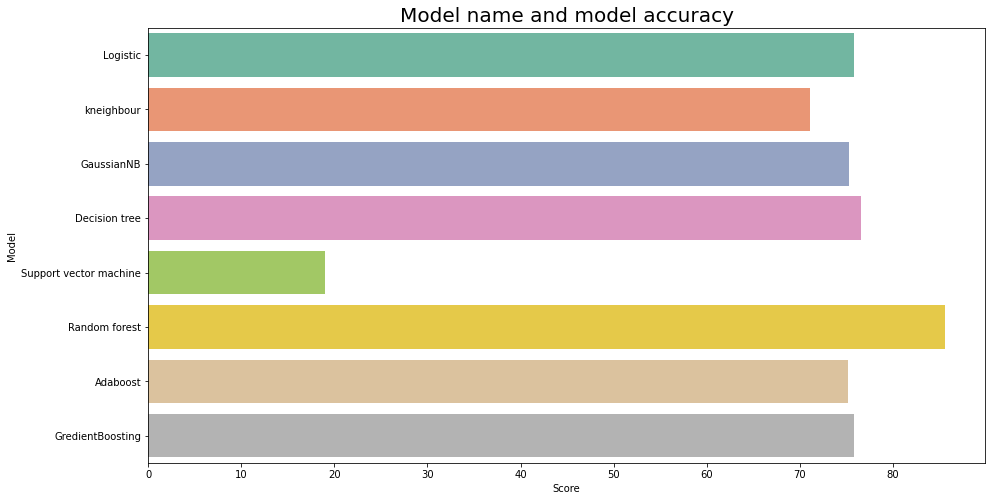

In [127]:
plt.figure(figsize=[15,8])
sns.barplot(data=final,y='Model',x='Score',palette='Set2')
plt.title("Model name and model accuracy",fontsize=20)
plt.show()

## Best Model
### We are chosing Random forest classifier as a best model, Because this model has least diffrence between model acuracy score and cross validation score and also its accuracy is highest as compare to others.That is why we are choosing RFC
### Model accuracy is : 85.67
### Cross_validation score : 85.61
### Diffrence : 0.06
.

.

## Hyper Parameter tuning
### Grid search cv

In [113]:
parameter=[{'n_estimators':[20,30,40,50],
           'criterion':['gini','entropy'],
           'max_depth':[5,15,20,25,30],
           'max_features':['sqrt','log']}]

In [114]:
GSC=GridSearchCV(rfc,parameter,cv=19)
GSC.fit(x_train,y_train)
GSC.best_params_

{'criterion': 'entropy',
 'max_depth': 25,
 'max_features': 'sqrt',
 'n_estimators': 30}

In [115]:
GSC.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=25, n_estimators=30)

In [116]:
GSC_pred=GSC.best_estimator_.predict(x_test)
accuracy_score(y_test,GSC_pred)

0.8517686692869174

In [139]:
tune_rfc=RandomForestClassifier(criterion='entropy', max_depth=25, n_estimators=30)
tune_rfc.fit(x_train,y_train)
pred=tune_rfc.predict(x_test)
print('Accuracy ',accuracy_score(y_test,pred))
print(confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy  0.8601909039865244
[[  20    2    1    0    0   42]
 [   0   60    8    9    1   62]
 [   0    6   41    4    0   47]
 [   0   15    0   32    0   34]
 [   0    6    0    1    1    0]
 [   0    5    3    3    0 1378]]
              precision    recall  f1-score   support

           0       1.00      0.31      0.47        65
           1       0.64      0.43      0.51       140
           4       0.77      0.42      0.54        98
           7       0.65      0.40      0.49        81
           8       0.50      0.12      0.20         8
           9       0.88      0.99      0.93      1389

    accuracy                           0.86      1781
   macro avg       0.74      0.44      0.53      1781
weighted avg       0.85      0.86      0.84      1781



## We have done with Grid search CV and we got our best model Random forest classifier with 86% accuracy.

## Feature importance

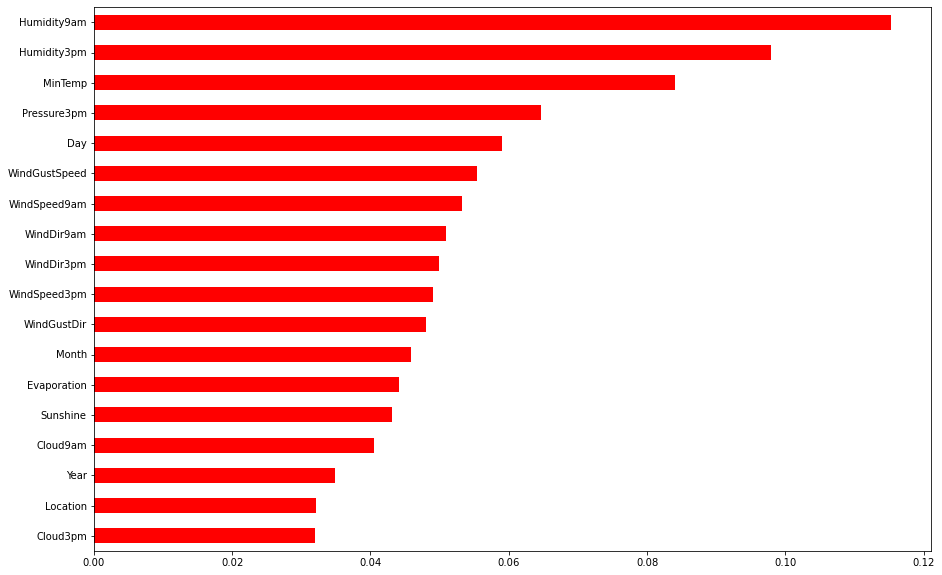

In [140]:
plt.figure(figsize=(15,10))
impo_features = pd.Series(tune_rfc.feature_importances_, index=x.columns)
impo_features.nlargest((25)).sort_values().plot(kind='barh', align='center',color='r')
plt.show()

## Prediction

In [141]:
predict=tune_rfc.predict(x_test)[:]

In [142]:
original=y_test[:]

In [143]:
rs=pd.DataFrame([predict,original],index=['Predict','Original'])

In [144]:
rs

,0,1,2,3,4,5,6,7,8,9,...,1771,1772,1773,1774,1775,1776,1777,1778,1779,1780
Predict,9,9,9,9,9,9,9,9,9,9,...,9,9,0,9,9,9,9,9,9,9
Original,4,9,9,9,9,9,9,9,9,9,...,9,9,0,9,9,9,9,9,9,9


## here : Rainfall in mm          

1-2          - 0

2-5 mm           - 1

10-50 mm         - 2

100-150 mm       - 3

150-200 mm       - 4

200-250 mm       - 5

350-400 mm       - 6

5-10 mm          - 7

50-100 mm        - 8

less than 1 - 9

## Saving the model 

In [145]:
import joblib

In [146]:
joblib.dump(tune_rfc,'Rainfall_prediction1.pkl')

['Rainfall_prediction1.pkl']

# Conclusion

From the above observations we are concluding that

1. We had null values in data set, So we adopted imputation technique.

2. In order to replace the object data to the int values we used encoading technique.

3. Some columns we dropped, because they was not more contributing to make prediction.

4. we changed Date column in the date time format to seprate the day, month and year.

We used many classifier for building our best model -

like-


A. Logistic regression

B. k nearest neighbour classifier

c. Design tree classifier

D. Support vector machine classifier

E. Multinomial NB

5. In order to control overfitting and underfitting we adopted Cross validation.

6. For Bagging and boosting we have used Random forest classifier,Adaboost classifier and Gradient boosting classifier and xgboost classifier.

7. we worked on Hyper parameter tuning on random forest regressor and random forest classifier for boosting our model accuracy.

Finally we got our best model Which is Random forest regressor with 86.07% accuracy.

In the end we have ploted bar plot for showing feature importance.

### Now our model is ready to predict with 86% accuracy.